Title: ERA5_SMARD_Comparison_yearly_NM.ipynb

Purpose: Compare output from SEM (with ERA5 climate data) with SMARD data (Data from German TSOs) to validate the model and calculate linear correction coefficients

This is the version with yearly data and the new (optimized) model

Author: Onno Nennecke on 29.04.2025 Modified: 23.02.2025

Input data: 

- ERA5 Residual Load Timeseries
    - This file lies here: /climca/people/onennecke/model_output/not_bias_corrected/full_year/ERA5_timeseries_wwd.nc
    - This file lies here: /climca/people/onennecke/model_output/not_bias_corrected/full_year/ERA5_timeseries_week.nc
- SMARD Production and demand Timeseries
    - This file lies here: /home/onennecke/SMARD_data/Realisierte_Erzeugung_201501010000_202505010000_Tag.csv
    - This file lies here: /home/onennecke/SMARD_data/Realisierter_Stromverbrauch_201501010000_202505010000_Tag.csv

Output data:

- regression_coefficients
    - This file lies here: /climca/people/onennecke/model_output/lr_correction/regression_coefficients.csv
- Evaluation Scatter Plots: Mod_eval_scatterplt, Mod_eval_scatterplt_winter, Mod_eval_scatterplt_high_rl
    - These files lie here: /home/onennecke/Code/Figures/
- Evaluation Demand Plots: demand_correlation_combined_draft, demand_correlation_weekly_draft, demand_correlation_wwd_draft, demand_correlation_wwd_draft_RM, demand_time_series_RM_draft, demand_time_series_draft, demand_rolling_mean_draft, demand_rolling_mean_combined_draft, demand_per_year_scatter_draft, demand_fit_germany_draft
    - These files lie here: /home/onennecke/Code/Figures/

In [ ]:
# Importing libraries
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr
# import scipy.ndimage as ndimage
# import os
# import glob

# Importing custom functions
import Functions.demand as demand

In [4]:
ERA5_dataset_wwd = xr.open_dataset('/climca/people/onennecke/model_output/not_bias_corrected/ERA5_yearly/ERA5_timeseries_wwd_yearly.nc')
ERA5_dataset = xr.open_dataset('/climca/people/onennecke/model_output/not_bias_corrected/ERA5_yearly/ERA5_hist_timeseries_yearly.nc')


# # ERA5_dataset = xr.open_dataset('/climca/people/onennecke/model_output/not_bias_corrected/full_year/ERA5_timeseries_wwd.nc')
# ERA5_dataset = xr.open_dataset('/climca/people/onennecke/model_output/bias_corrected_masked_ibicus/full_year/ERA5_timeseries_wwd.nc')

# # ERA5_dataset_week = xr.open_dataset('/climca/people/onennecke/model_output/not_bias_corrected/full_year/ERA5_timeseries_week.nc')
# ERA5_dataset_week = xr.open_dataset('/climca/people/onennecke/model_output/bias_corrected_masked_ibicus/full_year/ERA5_timeseries_week.nc')

ERA5_dataset.load()

<xarray.Dataset> Size: 321kB
Dimensions:        (time: 3650)
Coordinates:
  * time           (time) datetime64[ns] 29kB 2015-01-01 ... 2024-12-31
    crs            int64 8B 4326
    gridtype       <U6 24B 'lonlat'
    ESM            <U4 16B 'ERA5'
    run            <U4 16B 'hist'
    ESM_run        <U9 36B 'ERA5_hist'
    country        float64 8B 9.0
    period         <U4 16B 'week'
Data variables:
    temp           (time) float64 29kB 1.323 3.335 2.591 ... 0.7396 0.4142
    demand         (time) float64 29kB 1.504e+03 1.479e+03 ... 1.515e+03
    sfcWind        (time) float32 15kB 7.507 11.86 9.267 ... 6.159 8.049 8.775
    rsds           (time) float32 15kB 30.54 19.51 17.85 ... 28.84 26.3 31.92
    tas            (time) float32 15kB 1.771 3.587 3.046 ... 0.2238 1.512 1.194
    tasmax         (time) float32 15kB 3.431 5.871 4.704 ... 2.446 2.709 3.361
    wind_off_prod  (time) float64 29kB 81.14 81.17 81.17 ... 140.7 221.1 221.1
    wind_on_prod   (time) float64 29kB 388.2 796.9 559.3 ... 349.6 783.9 831.2
    solar_prod     (time) float64 29kB 21.88 10.73 10.6 ... 53.04 48.64 59.86
    total_prod     (time) float64 29kB 491.2 888.8 651.0 ... 1.054e+03 1.112e+03
    Netto          (time) float64 29kB -1.012e+03 -589.9 ... -457.1 -402.6
    Residual_load  (time) float64 29kB 1.012e+03 589.9 836.8 ... 457.1 402.6

### Load SMARD data

In [5]:
SMARD_data_prod = pd.read_csv('/home/onennecke/SMARD_data/Realisierte_Erzeugung_201501010000_202505010000_Tag.csv', sep=';', decimal=',', thousands='.')
SMARD_data_demand = pd.read_csv('/home/onennecke/SMARD_data/Realisierter_Stromverbrauch_201501010000_202505010000_Tag.csv', sep=';', decimal=',', thousands='.')

In [6]:

date = pd.to_datetime(SMARD_data_prod['Datum von'].astype(str).str.zfill(8), format='%d%m%Y')
demand_sm = SMARD_data_demand['Netzlast [MWh] Berechnete Auflösungen']
wind_off_prod = SMARD_data_prod['Wind Offshore [MWh] Berechnete Auflösungen']
wind_on_prod = SMARD_data_prod['Wind Onshore [MWh] Berechnete Auflösungen']
solar_prod = SMARD_data_prod['Photovoltaik [MWh] Berechnete Auflösungen']
total_prod = wind_off_prod + wind_on_prod + solar_prod
residual_load = demand_sm - total_prod

df = pd.DataFrame({
    'date': date,
    'demand_SMARD': demand_sm / 1000,  # Convert to GWh
    'wind_offshore_SMARD': wind_off_prod / 1000,  # Convert to GWh
    'wind_onshore_SMARD': wind_on_prod / 1000,  # Convert to GWh
    'solar_SMARD': solar_prod / 1000,  # Convert to GWh
    'total_production_SMARD': total_prod / 1000,  # Convert to GWh
    'residual_load_SMARD': residual_load / 1000,  # Convert to GWh
})


In [7]:
# Cut data to the same time period as ERA5 data (2015-2024)
df = df[(df['date'] >= '2015-01-01') & (df['date'] <= '2024-12-31')]
# Remove leap days
df = df[~((df['date'].dt.month == 2) & (df['date'].dt.day == 29))]
df

,date,demand_SMARD,wind_offshore_SMARD,wind_onshore_SMARD,solar_SMARD,total_production_SMARD,residual_load_SMARD
0,2015-01-01,1096.85275,12.50850,298.79175,17.08025,328.38050,768.47225
1,2015-01-02,1288.91475,10.32925,591.62075,7.75900,609.70900,679.20575
2,2015-01-03,1213.30950,12.11950,457.04350,7.23475,476.39775,736.91175
3,2015-01-04,1177.89600,11.53850,379.02950,19.98250,410.55050,767.34550
4,2015-01-05,1425.92750,7.74550,219.62350,26.52225,253.89125,1172.03625
...,...,...,...,...,...,...,...
3648,2024-12-27,1155.15125,2.94125,46.42200,61.20575,110.56900,1044.58225
3649,2024-12-28,1150.65975,22.34775,31.44225,61.08850,114.87850,1035.78125
3650,2024-12-29,1179.16200,97.29825,257.39450,39.71900,394.41175,784.75025
3651,2024-12-30,1278.28500,61.18675,534.34725,22.92750,618.46150,659.82350


### Combine both datasets

In [8]:
df['sfcWind'] = ERA5_dataset['sfcWind'].values
df['rsds'] = ERA5_dataset['rsds'].values
df['tas'] = ERA5_dataset['tas'].values
df['tasmax'] = ERA5_dataset['tasmax'].values
df['temp_ERA5'] = ERA5_dataset['temp'].values
df['demand_ERA5_wwd'] = ERA5_dataset_wwd['demand'].values
df['demand_ERA5'] = ERA5_dataset['demand'].values
df['RL_ERA5'] = ERA5_dataset['Residual_load']

df['wind_offshore_ERA5'] = ERA5_dataset['wind_off_prod'].values
df['wind_onshore_ERA5'] = ERA5_dataset['wind_on_prod'].values
df['solar_ERA5'] = ERA5_dataset['solar_prod'].values
df['total_production_ERA5'] = df['wind_offshore_ERA5'] + df['wind_onshore_ERA5'] + df['solar_ERA5']
df['total_production_ERA5_check'] = ERA5_dataset['total_prod'].values

In [9]:
# Add weekday or weekend
df['weekday'] = df['date'].dt.dayofweek + 1
df['period'] = np.where(df['weekday'] <= 5, 'Weekday', 'Weekend')

In [10]:
# Define national fixed-date holidays (month, day)
fixed_holidays = [
    (1, 1),   # New Year's Day
    (5, 1),   # Labor Day
    (10, 3),  # German Unity Day
]

# Start by setting all to 'other'
df['special'] = df['period'].copy()

# Summer
df.loc[(df['date'].dt.month == 7) & (df['date'].dt.day >= 15), 'special'] = 'summer'
df.loc[(df['date'].dt.month == 8) & (df['date'].dt.day <= 15), 'special'] = 'summer'


# Christmas period (Dec 20–31)
df.loc[(df['date'].dt.month == 12) & (df['date'].dt.day >= 23), 'special'] = 'christmas'

# Fixed-date holidays
is_fixed_holiday = df['date'].dt.month.astype(str).str.zfill(2) + '-' + df['date'].dt.day.astype(str).str.zfill(2)
fixed_strs = [f"{m:02d}-{d:02d}" for m, d in fixed_holidays]
df.loc[is_fixed_holiday.isin(fixed_strs), 'special'] = 'holiday'

### linear regression-based bias correction

In [11]:
# List to store coefficient records
coeff_records = []

variables = [
    ('wind_onshore_SMARD', 'wind_onshore_ERA5'),
    ('wind_offshore_SMARD', 'wind_offshore_ERA5'),
    ('solar_SMARD', 'solar_ERA5'),
    ('total_production_SMARD', 'total_production_ERA5')
]
for smard_var, era5_var in variables:
    smard = df[smard_var].values
    era5 = df[era5_var].values

    model = LinearRegression()
    model.fit(smard.reshape(-1, 1), era5)

    a = model.coef_[0]
    b = model.intercept_
    
    print(f"Regression coefficients for {era5_var}: a = {a}, b = {b}")
    
    coeff_records.append({
        "variable": era5_var[:-5],
        "a": a,
        "b": b
    })

    # Apply correction (inverse of the regression model to align with 1:1 line)
    era5_corrected = (era5 - b) / a
    
    df[era5_var + '_corrected'] = era5_corrected
    
df['tot_prod_other'] = df['wind_onshore_ERA5_corrected'] + df['wind_offshore_ERA5_corrected'] + df['solar_ERA5_corrected']
df['RL_corrected_old'] = df['demand_ERA5'] - df['total_production_ERA5_corrected']

Regression coefficients for wind_onshore_ERA5: a = 1.2452118038806252, b = -80.46661159152046
Regression coefficients for wind_offshore_ERA5: a = 1.160741222064657, b = -11.3875451004633
Regression coefficients for solar_ERA5: a = 0.9971230681127385, b = -3.5648230123617424
Regression coefficients for total_production_ERA5: a = 1.2810737431018082, b = -146.70945238242132


In [12]:
df['tot_prod_s_off_corrected'] = df['wind_onshore_ERA5'] + df['wind_offshore_ERA5_corrected'] + df['solar_ERA5_corrected']
df['tot_prod_s_corrected'] = df['wind_onshore_ERA5'] + df['wind_offshore_ERA5'] + df['solar_ERA5_corrected']

In [13]:
df['RL_corrected'] = df['demand_ERA5'] - df['tot_prod_s_corrected']

In [14]:
coeff_records

# Convert to DataFrame and save as CSV
coeff_df = pd.DataFrame(coeff_records)
coeff_df
# coeff_df.to_csv('/climca/people/onennecke/model_output/lr_correction/regression_coefficients.csv', index=False)

,variable,a,b
0,wind_onshore,1.245212,-80.466612
1,wind_offshore,1.160741,-11.387545
2,solar,0.997123,-3.564823
3,total_production,1.281074,-146.709452


In [13]:
coeff_df

,variable,a,b
0,wind_onshore,1.245212,-80.466612
1,wind_offshore,1.160741,-11.387545
2,solar,0.997123,-3.564823
3,total_production,1.281074,-146.709452


## Make KS Test

In [27]:
df.columns

Index(['date', 'demand_SMARD', 'wind_offshore_SMARD', 'wind_onshore_SMARD',
       'solar_SMARD', 'total_production_SMARD', 'residual_load_SMARD',
       'sfcWind', 'rsds', 'tas', 'tasmax', 'temp_ERA5', 'demand_ERA5_wwd',
       'demand_ERA5', 'RL_ERA5', 'wind_offshore_ERA5', 'wind_onshore_ERA5',
       'solar_ERA5', 'total_production_ERA5', 'total_production_ERA5_check',
       'weekday', 'period', 'special', 'wind_onshore_ERA5_corrected',
       'wind_offshore_ERA5_corrected', 'solar_ERA5_corrected',
       'total_production_ERA5_corrected', 'tot_prod_other', 'RL_corrected_old',
       'tot_prod_s_off_corrected', 'tot_prod_s_corrected', 'RL_corrected'],
      dtype='object')

In [33]:
# Make a table for KS and p-values for all variables
variables = [
    ('wind_onshore_SMARD', 'wind_onshore_ERA5'),
    ('wind_offshore_SMARD', 'wind_offshore_ERA5'),
    ('solar_SMARD', 'solar_ERA5'),
    ('total_production_SMARD', 'total_production_ERA5'),
    # ('demand_SMARD', 'demand_ERA5_wwd'),
    # ('residual_load_SMARD', 'RL_ERA5')
]

ks_results = []
for smard_var, era5_var in variables:
    sample1 = df[smard_var]
    sample2 = df[era5_var]
    
    statistic, p_value = stats.ks_2samp(sample1, sample2)
    
    ks_results.append({
        "variable": era5_var[:-5],
        "ks_statistic": statistic,
        "p_value": p_value
    })
ks_df = pd.DataFrame(ks_results)
ks_df

,variable,ks_statistic,p_value
0,wind_onshore,0.164110,2.638593e-43
1,wind_offshore,0.148219,2.252280e-35
2,solar,0.058082,8.935123e-06
3,total_production,0.158082,3.360286e-40


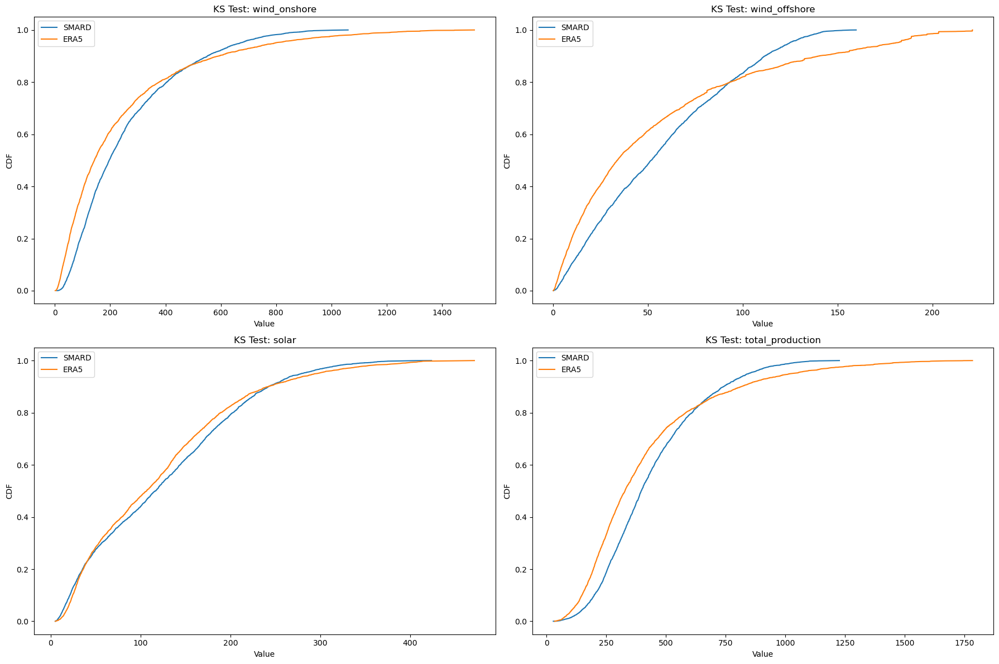

In [35]:
# Visualize the KS test for all variables in one plot with subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
for i, (smard_var, era5_var) in enumerate(variables):
    sample1 = df[smard_var]
    sample2 = df[era5_var]
    
    sample1_sorted = np.sort(sample1)
    ecdf_sample1 = np.arange(1, len(sample1_sorted)+1) / len(sample1_sorted)
    sample2_sorted = np.sort(sample2)
    ecdf_sample2 = np.arange(1, len(sample2_sorted)+1) / len(sample2_sorted)
    
    ax = axes[i//2, i%2]
    ax.plot(sample1_sorted, ecdf_sample1, label='SMARD')
    ax.plot(sample2_sorted, ecdf_sample2, label='ERA5')
    ax.set_title(f"KS Test: {era5_var[:-5]}")
    ax.set_xlabel("Value")
    ax.set_ylabel("CDF")
    ax.legend()
plt.tight_layout()
plt.show()

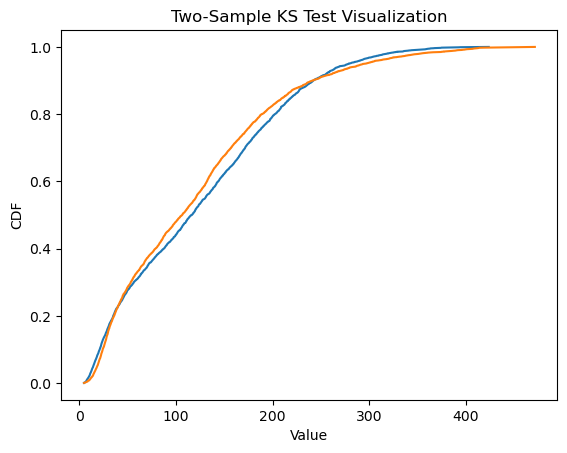

KS Statistic: 0.0


In [ ]:

sample1 = df['solar_SMARD']
sample2 = df['solar_ERA5']

sample1_sorted = np.sort(sample1)
ecdf_sample1 = np.arange(1, len(sample1_sorted)+1) / len(sample1_sorted)
sample2_sorted = np.sort(sample2)
ecdf_sample2 = np.arange(1, len(sample2_sorted)+1) / len(sample2_sorted)

# KS statistic
ks_stat = np.max(np.abs(ecdf_sample1 - ecdf_sample2))

# Plot
plt.figure()
plt.plot(sample1_sorted, ecdf_sample1)
plt.plot(sample2_sorted, ecdf_sample2)
plt.title("Two-Sample KS Test Visualization")
plt.xlabel("Value")
plt.ylabel("CDF")
plt.show()

print("KS Statistic:", ks_stat)

## Make plots to compare the datasets

### Production

#### Plot for thesis

In [15]:
def plot_all(df, setlim=False, maintitle=None):
    rows = [
        "wind_onshore",
        # 'wind_onshore_cor',
        "wind_offshore",
        # "wind_offshore_cor",
        "solar",
        # "solar_cor",
        "total_production",
        # "total_production_cor"
    ]
    cols = ["whole_year", "winter", 'perc']

    # Create empty DataFrame (filled with NaN)
    metrics = pd.DataFrame(index=rows, columns=cols)
    
    # --- Make all text bigger (global defaults) ---

    mpl.rcParams.update({
        'font.size': 14+2,             # base font size (affects legends, labels, etc. unless overridden)
        'axes.titlesize': 18+2,        # axes title
        'axes.labelsize': 16+2,        # x/y labels
        'xtick.labelsize': 14+2,       # x tick labels
        'ytick.labelsize': 14+2,       # y tick labels
        'legend.fontsize': 16+2,       # legend text
        'figure.titlesize': 20+2,      # figure title (if used)
    })

    fig, axs = plt.subplots(2, 2, figsize=(16, 12))
    if maintitle:
        fig.suptitle(maintitle, fontsize=22, fontweight='bold')
    plot_specs = [
        ('wind_onshore_SMARD', 'wind_onshore_ERA5', 'Onshore Wind Production'),
        ('wind_offshore_SMARD', 'wind_offshore_ERA5', 'Offshore Wind Production'),
        ('solar_SMARD', 'solar_ERA5', 'Solar Production'),
        ('total_production_SMARD', 'total_production_ERA5', 'Total Renewable Production')
    ]

    subplot_labels = ['(a)', '(b)', '(c)', '(d)']

    for idx, (ax, (col_smard, col_era5, title)) in enumerate(zip(axs.flat, plot_specs)):
        top = col_smard[0:-6]
        # top_cor = col_smard[0:-6] + '_cor'

        sns.scatterplot(x=col_smard, y=col_era5, data=df, alpha=0.6, ax=ax)
        
        # Regression line
        sns.regplot(x=col_smard, y=col_era5, data=df, scatter=False, color='black',
                    line_kws={'linewidth': 1.5, 'alpha': 0.7}, ax=ax)
        
        # 1:1 line
        min_val = min(df[col_smard].min(), df[col_era5].min())
        max_val = max(df[col_smard].max(), df[col_era5].max())
        ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--')

        # Adjust axes
        xrange = df[col_smard].max() - df[col_smard].min()
        min_ERA5 = df[col_era5].min()
        max_ERA5 = df[col_era5].max()
        yrange_ERA5 = max_ERA5 - min_ERA5
        ax.set_xlim(df[col_smard].min() - xrange * 0.03, df[col_smard].max() + xrange * 0.03)
        ax.set_ylim(min_ERA5 - xrange * 0.03, max_ERA5 + xrange * 0.03)
        
        if setlim:
            ax.set_ylim(0, yrange_ERA5/4)
            ax.set_xlim(0, yrange_ERA5/4)


        # Metrics
        r, _ = pearsonr(df[col_smard], df[col_era5])
        rmse = np.sqrt(np.mean((df[col_smard] - df[col_era5])**2))
        metrics.loc[top, 'whole_year'] = rmse
        # metrics.loc[top_cor, 'whole_year'] = rmse_corrected

        # Plot labels, titles (made larger)
        ax.set_xlabel(f'{title}\n- SMARD (GWh/day)')
        ax.set_ylabel(f'{title}\n- SEM (GWh/day)')
        ax.set_title(subplot_labels[idx], loc='left', fontweight='bold')
        ax.grid(True, linestyle='--', alpha=0.3)

        textstr = '\n'.join((
                f'RMSE = {rmse:.2f}',
                f'Pearson r = {r:.2f}'
            ))
        ax.text(0.98, 0.03, textstr, transform=ax.transAxes,
                va='bottom', ha='right',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

    # Create a common legend
    legend_elements = [
        Line2D([0], [0], linestyle='--', color='red', label='1:1 Line'),
        Line2D([0], [0], linestyle='-', color='black', label='Regression Line'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', label='Data Points', alpha=0.6),
        # Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', label='Corrected Data Points', alpha=0.6),
    ]

    # Place common legend below all subplots (fontsize increased slightly)
    fig.legend(handles=legend_elements, loc='lower center', ncol=4, frameon=True, bbox_to_anchor=(0.5, 0))

    plt.tight_layout(rect=[0, 0.05, 1, 1])  # leave space for legend

    # Save the figure
    plt.savefig('/home/onennecke/Code/Figures/Mod_eval_scatterplt.png', dpi=300, bbox_inches='tight')
    plt.show()


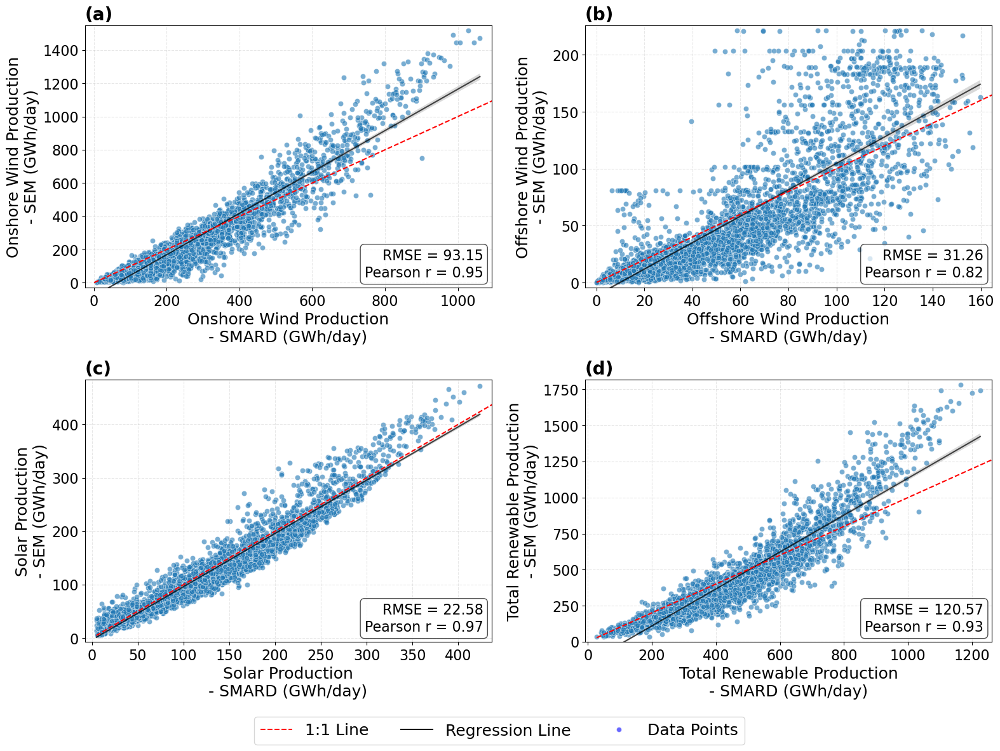

In [16]:
plot_all(df, setlim=False)

#### Only winter data

In [35]:
df_win = df[df['date'].dt.month.isin([1, 2, 3, 10, 11, 12])]
df_win

,date,demand_SMARD,wind_offshore_SMARD,wind_onshore_SMARD,solar_SMARD,total_production_SMARD,residual_load_SMARD,sfcWind,rsds,tas,...,special,wind_onshore_ERA5_corrected,wind_offshore_ERA5_corrected,solar_ERA5_corrected,total_production_ERA5_corrected,tot_prod_other,RL_corrected_old,tot_prod_s_off_corrected,tot_prod_s_corrected,RL_corrected
0,2015-01-01,1096.85275,12.50850,298.79175,17.08025,328.38050,768.47225,7.506850,30.539927,1.771455,...,holiday,376.357052,79.717180,25.518171,497.949859,481.592403,1005.633365,493.412983,494.839275,1008.743949
1,2015-01-02,1288.91475,10.32925,591.62075,7.75900,609.70900,679.20575,11.862523,19.505219,3.586776,...,Weekday,704.560760,79.736244,14.331401,808.276003,798.628406,670.370691,890.928409,892.357765,586.288929
2,2015-01-03,1213.30950,12.11950,457.04350,7.23475,476.39775,736.91175,9.267174,17.846884,3.046391,...,Weekend,513.765159,79.736244,14.208650,622.725925,607.710053,865.155279,653.224723,654.654079,833.227125
3,2015-01-04,1177.89600,11.53850,379.02950,19.98250,410.55050,767.34550,8.975194,35.401741,2.561011,...,Weekend,432.868154,61.259140,25.811682,536.383205,519.938976,954.545610,545.616745,544.076069,946.852745
4,2015-01-05,1425.92750,7.74550,219.62350,26.52225,253.89125,1172.03625,6.101583,29.677082,1.703392,...,Weekday,209.566898,24.770056,26.599355,286.884424,260.936309,1216.504651,231.857974,224.451998,1278.937077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3648,2024-12-27,1155.15125,2.94125,46.42200,61.20575,110.56900,1044.58225,2.513451,32.226482,1.191884,...,christmas,79.674582,14.684296,66.049500,182.195874,160.408378,1328.999658,99.478914,90.451741,1420.743791
3649,2024-12-28,1150.65975,22.34775,31.44225,61.08850,114.87850,1035.78125,3.093119,34.692463,-0.210155,...,christmas,92.472013,23.489149,70.858786,206.356169,186.819949,1324.071982,129.028567,121.416696,1409.011455
3650,2024-12-29,1179.16200,97.29825,257.39450,39.71900,394.41175,784.75025,6.158602,28.835943,0.223771,...,christmas,345.366747,131.008758,56.769896,538.625560,533.145401,989.596699,537.366793,547.037756,981.184503
3651,2024-12-30,1278.28500,61.18675,534.34725,22.92750,618.46150,659.82350,8.049464,26.303263,1.511976,...,christmas,694.164335,200.303935,52.358554,937.011674,946.826824,573.778670,1036.577502,1057.387056,453.403288


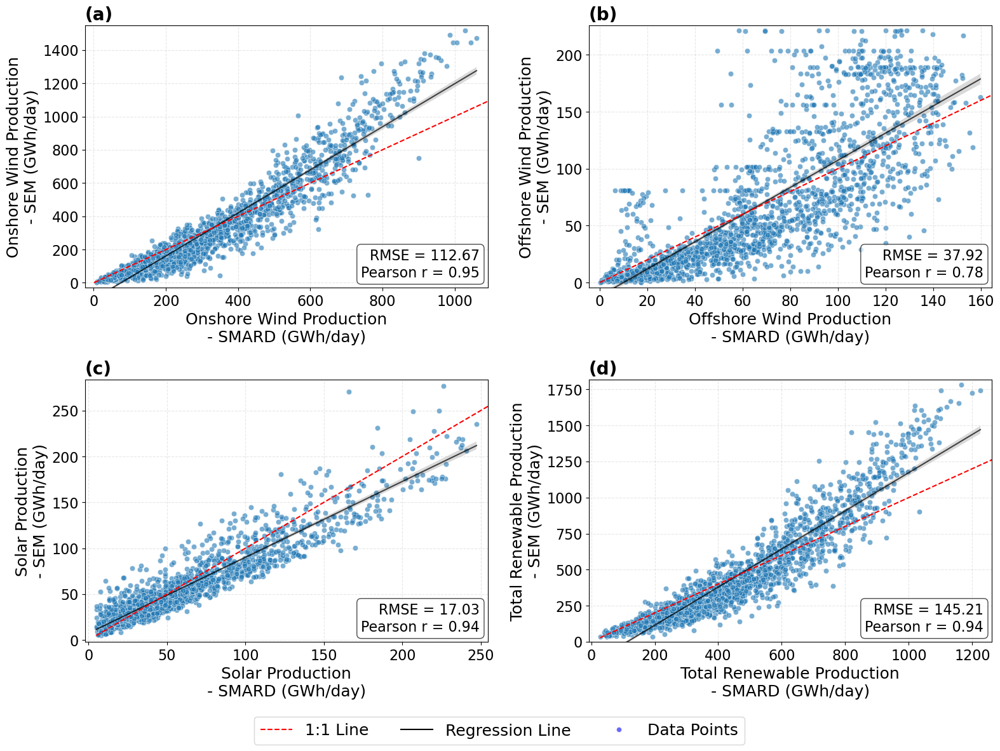

In [36]:
plot_all(df_win, setlim=False)

In [52]:
rows = ['wind_onshore', 'wind_offshore', 'solar', 'total_production']
cols = ["whole_year", "winter", 'perc']

metrics = pd.DataFrame(index=rows, columns=cols)

for col_smard, col_era5 in zip(['wind_onshore_SMARD', 'wind_offshore_SMARD', 'solar_SMARD', 'total_production_SMARD'],
                            ['wind_onshore_ERA5', 'wind_offshore_ERA5', 'solar_ERA5', 'total_production_ERA5']):
    top = col_smard[0:-6]
    # Metrics
    r, _ = pearsonr(df[col_smard], df[col_era5])
    rmse = np.sqrt(np.mean((df[col_smard] - df[col_era5])**2))
    metrics.loc[top, 'whole_year'] = rmse
    
    r, _ = pearsonr(df_win[col_smard], df_win[col_era5])
    rmse = np.sqrt(np.mean((df_win[col_smard] - df_win[col_era5])**2))
    metrics.loc[top, 'winter'] = rmse

# Calculate how much worse/better the winter data is compared to the full dataset in percent in the third column of the `metrics` DataFrame
metrics['perc'] = (metrics['winter'] - metrics['whole_year']) / metrics['whole_year'] * 100
metrics

,whole_year,winter,perc
wind_onshore,93.147912,112.666631,20.954543
wind_offshore,31.258464,37.915113,21.295508
solar,22.576591,17.026068,-24.585304
total_production,120.568168,145.211062,20.438972


In [42]:
# Filter only the 10 % highest values of the residual load
df_highest_residual = df[df['RL_ERA5'] > df['RL_ERA5'].quantile(0.9)]
df_lowest_prod = df[df['tot_prod_s_corrected'] < df['tot_prod_s_corrected'].quantile(0.1)]
df_highest_demand = df[df['demand_ERA5'] > df['demand_ERA5'].quantile(0.9)]

In [44]:
print(df['RL_corrected'].quantile(0.95))
df_LEE = df[df['RL_corrected'] > df['RL_corrected'].quantile(0.95)]

1364.2349844094447


In [45]:
len(df_LEE)

183

In [53]:
metrics['high_rl'] = np.nan
metrics

for col_smard, col_era5 in zip(['wind_onshore_SMARD', 'wind_offshore_SMARD', 'solar_SMARD', 'total_production_SMARD'],
                            ['wind_onshore_ERA5', 'wind_offshore_ERA5', 'solar_ERA5', 'total_production_ERA5']):
    top = col_smard[0:-6]
    # Metrics
    r, _ = pearsonr(df_LEE[col_smard], df_LEE[col_era5])
    rmse = np.sqrt(np.mean((df_LEE[col_smard] - df_LEE[col_era5])**2))
    metrics.loc[top, 'high_rl'] = rmse
metrics['perc_rl'] = (metrics['high_rl'] - metrics['whole_year']) / metrics['whole_year'] * 100
metrics

,whole_year,winter,perc,high_rl,perc_rl
wind_onshore,93.147912,112.666631,20.954543,51.209057,-45.023935
wind_offshore,31.258464,37.915113,21.295508,19.285166,-38.304179
solar,22.576591,17.026068,-24.585304,14.183756,-37.174947
total_production,120.568168,145.211062,20.438972,63.641163,-47.215617


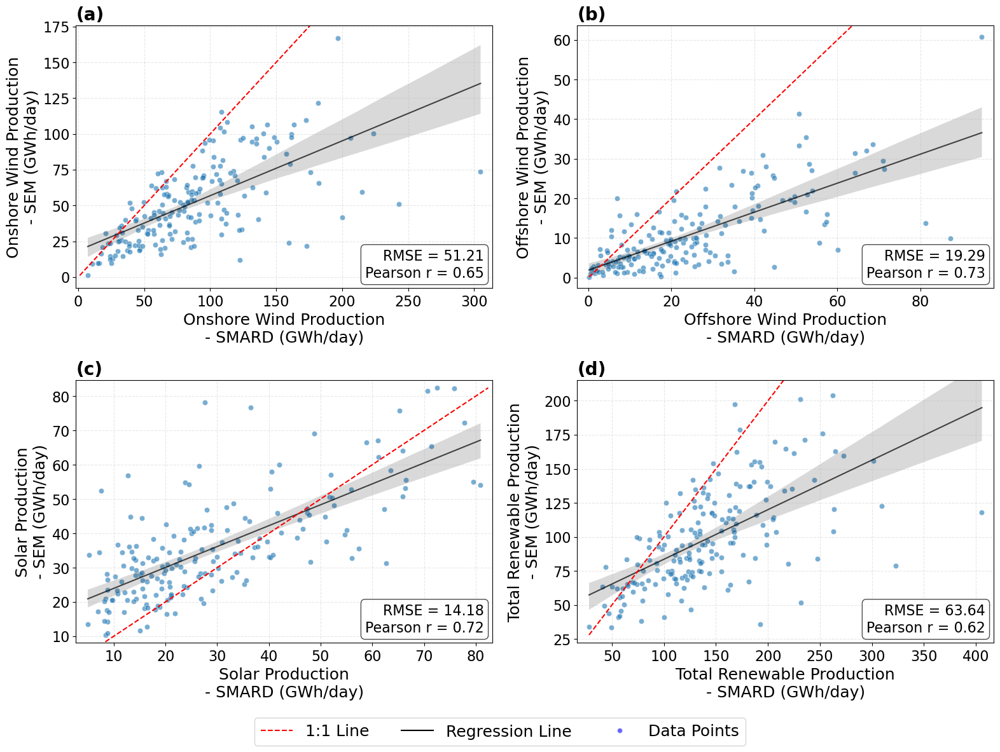

In [47]:
plot_all(df_LEE, setlim=False)

### Demand

In [62]:
df_demand = df.drop(columns=['wind_offshore_SMARD', 'wind_onshore_SMARD', 'solar_SMARD', 'total_production_SMARD',
                             'wind_onshore_ERA5', 'wind_offshore_ERA5', 'solar_ERA5', 'total_production_ERA5'])
df_demand['dem_SMARD_RM'] = df_demand['demand_SMARD'].rolling(window=7, min_periods=1).mean()
df_demand['dem_ERA5_RM'] = df_demand['demand_ERA5'].rolling(window=7, min_periods=1).mean()
df_demand['dem_ERA5_wwd_RM'] = df_demand['demand_ERA5_wwd'].rolling(window=7, min_periods=1).mean()
df_demand

,date,demand_SMARD,residual_load_SMARD,sfcWind,rsds,tas,tasmax,temp_ERA5,demand_ERA5_wwd,demand_ERA5,RL_ERA5,total_production_ERA5_check,weekday,period,special,dem_SMARD_RM,dem_ERA5_RM,dem_ERA5_wwd_RM
0,2015-01-01,1096.85275,768.47225,7.506850,30.539927,1.771455,3.431339,1.323001,1581.917233,1503.583224,1012.382186,491.201038,4,Weekday,holiday,1096.852750,1503.583224,1581.917233
1,2015-01-02,1288.91475,679.20575,11.862523,19.505219,3.586776,5.871274,3.334620,1556.334218,1478.646694,589.894982,888.751712,5,Weekday,Weekday,1192.883750,1491.114959,1569.125726
2,2015-01-03,1213.30950,736.91175,9.267174,17.846884,3.046391,4.704414,2.591276,1291.701049,1487.881204,836.832825,651.048379,6,Weekend,Weekend,1199.692333,1490.037041,1476.650833
3,2015-01-04,1177.89600,767.34550,8.975194,35.401741,2.561011,4.239970,2.345489,1294.625490,1490.928814,950.491827,540.436987,7,Weekend,Weekend,1194.243250,1490.259984,1431.144497
4,2015-01-05,1425.92750,1172.03625,6.101583,29.677082,1.703392,3.319645,1.338708,1581.718548,1503.389075,1282.578425,220.810651,1,Weekday,Weekday,1240.580100,1492.885802,1461.259308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3648,2024-12-27,1155.15125,1044.58225,2.513451,32.226482,1.191884,3.729366,0.706743,1589.701965,1511.195532,1424.498634,86.696898,5,Weekday,christmas,1168.716750,1481.356119,1481.263696
3649,2024-12-28,1150.65975,1035.78125,3.093119,34.692463,-0.210155,2.485461,-0.852848,1332.645250,1530.428151,1412.780134,117.648017,6,Weekend,christmas,1151.682214,1491.388453,1490.893771
3650,2024-12-29,1179.16200,784.75025,6.158602,28.835943,0.223771,2.445564,-0.673827,1330.517982,1528.222259,984.912649,543.309610,7,Weekend,christmas,1150.412393,1499.919366,1499.088455
3651,2024-12-30,1278.28500,659.82350,8.049464,26.303263,1.511976,2.708793,0.739563,1589.287859,1510.790344,457.118743,1053.671601,1,Weekday,christmas,1150.707071,1503.625650,1502.885688


/tmp/ipykernel_465077/3520207648.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, alpha=0.6, palette='Set2', ax=ax, label='7-day Rolling Mean')


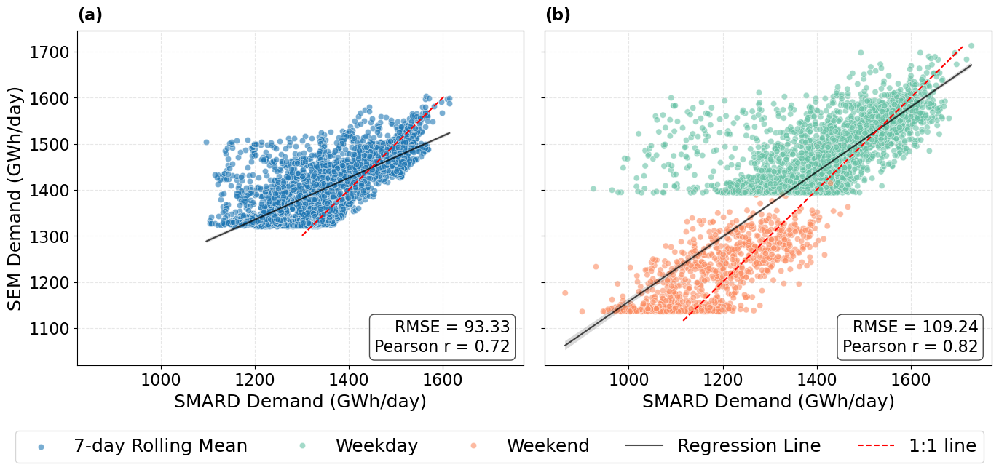

In [63]:
# --- Make all text bigger (global defaults) ---
mpl.rcParams.update({
    'font.size': 14+2,         # base font size
    'axes.labelsize': 16+2,    # x/y labels
    'axes.titlesize': 18+2,    # axes titles (if used)
    'xtick.labelsize': 14+2,   # x tick labels
    'ytick.labelsize': 14+2,   # y tick labels
    'legend.fontsize': 16+2,   # legend text
    'figure.titlesize': 20+2,  # figure title (if used)
})

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# -------------------------
# Subplot (a)
# -------------------------
ax = axes[0]
sns.scatterplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, alpha=0.6, palette='Set2', ax=ax, label='7-day Rolling Mean')

# Regression line
sns.regplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, scatter=False, 
            color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7}, ax=ax)

# Metrics: Pearson correlation + RMSE (drop NaNs for safe calc)
sub = df_demand[['dem_SMARD_RM', 'dem_ERA5_RM']].dropna()
r, _ = pearsonr(sub['dem_SMARD_RM'], sub['dem_ERA5_RM'])
rmse = np.sqrt(np.mean((sub['dem_SMARD_RM'] - sub['dem_ERA5_RM'])**2))

# Put both metrics into a boxed text at lower right (larger font)
textstr = '\n'.join((
    f'RMSE = {rmse:.2f}',
    f'Pearson r = {r:.2f}'
))
ax.text(0.97, 0.03, textstr, transform=ax.transAxes,
        va='bottom', ha='right',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

# 1:1 line
x = np.linspace(df_demand['dem_ERA5_RM'].min()-20, df_demand['dem_ERA5_RM'].max(), 100)
ax.plot(x, x, color='red', linestyle='--')

# Bigger axis labels (only size changed)
ax.set_xlabel('SMARD Demand (GWh/day)')
ax.set_ylabel('SEM Demand (GWh/day)')

ax.grid(True, linestyle='--', alpha=0.3)
# remove individual legend to avoid duplicates in combined legend (safe removal)
if getattr(ax, "legend_", None):
    ax.legend_.remove()

# Panel label (made larger)
ax.text(0, 1.07, '(a)', transform=ax.transAxes, fontweight='bold', va='top')

# -------------------------
# Subplot (b)
# -------------------------
ax = axes[1]
sns.scatterplot(x='demand_SMARD', y='demand_ERA5_wwd', hue='period', data=df_demand, 
                alpha=0.6, palette='Set2', ax=ax)

# Regression line
sns.regplot(x='demand_SMARD', y='demand_ERA5_wwd', data=df_demand, scatter=False, 
            color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7}, ax=ax, label='Regression Line')

# Metrics: Pearson correlation + RMSE (drop NaNs for safe calc)
sub = df_demand[['demand_SMARD', 'demand_ERA5_wwd']].dropna()
r, _ = pearsonr(sub['demand_SMARD'], sub['demand_ERA5_wwd'])
rmse = np.sqrt(np.mean((sub['demand_SMARD'] - sub['demand_ERA5_wwd'])**2))

# Put both metrics into a boxed text at lower right (larger font)
textstr = '\n'.join((
    f'RMSE = {rmse:.2f}',
    f'Pearson r = {r:.2f}'
))
ax.text(0.97, 0.03, textstr, transform=ax.transAxes,
        va='bottom', ha='right',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

# 1:1 line
x = np.linspace(df_demand['demand_ERA5_wwd'].min()-20, df_demand['demand_ERA5_wwd'].max(), 100)
ax.plot(x, x, color='red', linestyle='--', label='1:1 line')

# Bigger axis labels
ax.set_xlabel('SMARD Demand (GWh/day)')
ax.set_ylabel('SEM Demand (GWh/day)')

ax.grid(True, linestyle='--', alpha=0.3)
# remove individual legend to avoid duplicates in combined legend (safe removal)
if getattr(ax, "legend_", None):
    ax.legend_.remove()

# --- remove per-axis legends above ---
# Create shared legend underneath both subplots
handles1, labels1 = axes[0].get_legend_handles_labels()
handles2, labels2 = axes[1].get_legend_handles_labels()

# combine while preserving order and skipping empty labels
seen = set()
combined = []
for h, l in zip(handles1 + handles2, labels1 + labels2):
    if l and l not in seen:
        seen.add(l)
        combined.append((h, l))

if combined:
    handles, labels = zip(*combined)
    plt.subplots_adjust(bottom=0.18)                      # make room at bottom
    # make shared legend text larger
    fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.1))

# Panel label (b) (made larger)
ax.text(0, 1.07, '(b)', transform=ax.transAxes, fontweight='bold', va='top')

plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_correlation_combined.png', dpi=300, bbox_inches='tight')

plt.show()

/tmp/ipykernel_1374776/3674114207.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, alpha=0.6, palette='Set2')


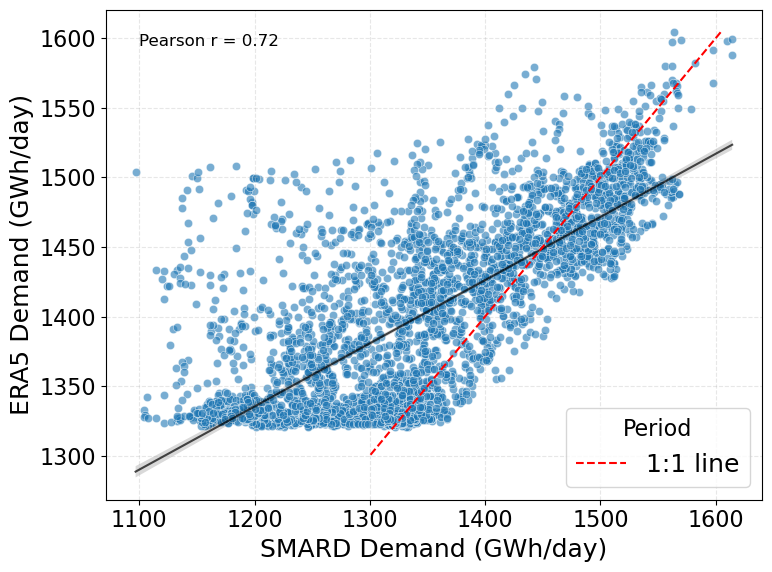

In [35]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, alpha=0.6, palette='Set2')

# Optional regression line (overall trend)
sns.regplot(x='dem_SMARD_RM', y='dem_ERA5_RM', data=df_demand, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})

# Pearson correlation
r, _ = pearsonr(df_demand['dem_SMARD_RM'], df_demand['dem_ERA5_RM'])
plt.text(0.05, 0.95, f'Pearson r = {r:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Plot 1:1 line
x = np.linspace(df_demand['dem_ERA5_RM'].min()-20, df_demand['dem_ERA5_RM'].max(), 100)
y = x
plt.plot(x, y, color='red', linestyle='--', label='1:1 line')


plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
# plt.title('Correlation between SMARD and ERA5 Demand by Period')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title='Period', loc='best')
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_correlation_weekly_draft.png', dpi=300, bbox_inches='tight')
plt.show()


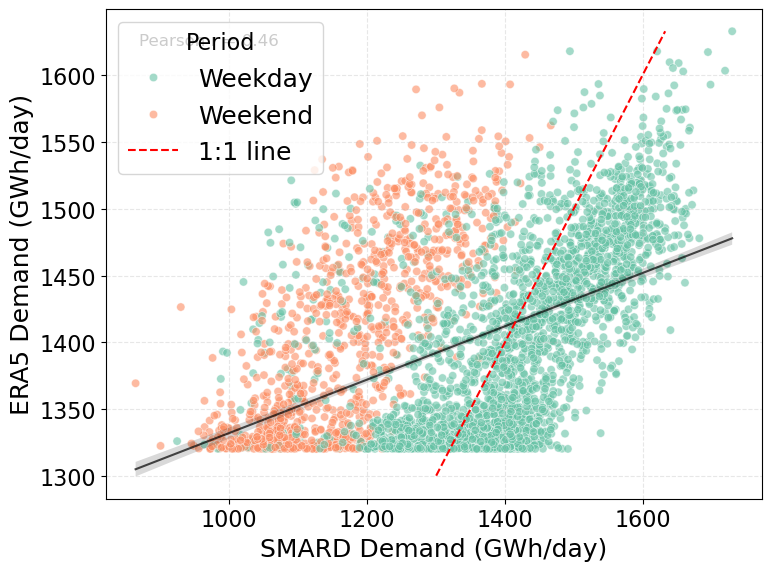

In [36]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='demand_SMARD', y='demand_ERA5', hue='period', data=df_demand, alpha=0.6, palette='Set2')

# Optional regression line (overall trend)
sns.regplot(x='demand_SMARD', y='demand_ERA5', data=df_demand, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})

# Pearson correlation
r, _ = pearsonr(df_demand['demand_SMARD'], df_demand['demand_ERA5'])
plt.text(0.05, 0.95, f'Pearson r = {r:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Plot 1:1 line
x = np.linspace(df_demand['demand_ERA5'].min()-20, df_demand['demand_ERA5'].max(), 100)
y = x
plt.plot(x, y, color='red', linestyle='--', label='1:1 line')


plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
# plt.title('Correlation between SMARD and ERA5 Demand by Period')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title='Period', loc='best')
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_correlation_wwd_draft_RM.png', dpi=300, bbox_inches='tight')
plt.show()


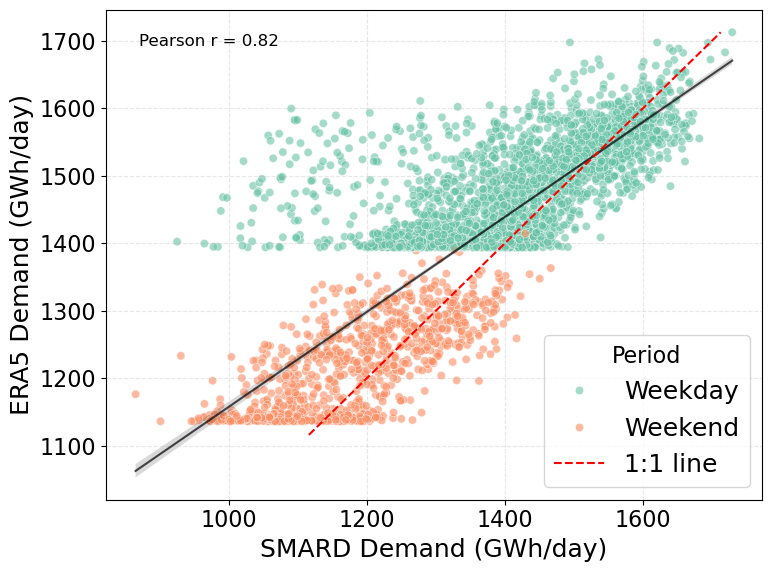

In [37]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='demand_SMARD', y='demand_ERA5_wwd', hue='period',  data=df_demand, alpha=0.6, palette='Set2')

# Optional regression line (overall trend)
sns.regplot(x='demand_SMARD', y='demand_ERA5_wwd', data=df_demand, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})

# Pearson correlation
r, _ = pearsonr(df_demand['demand_SMARD'], df_demand['demand_ERA5_wwd'])
plt.text(0.05, 0.95, f'Pearson r = {r:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Plot 1:1 line
x = np.linspace(df_demand['demand_ERA5_wwd'].min()-20, df_demand['demand_ERA5_wwd'].max(), 100)
y = x
plt.plot(x, y, color='red', linestyle='--', label='1:1 line')


plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
# plt.title('Correlation between SMARD and ERA5 Demand by Period')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title='Period', loc='best')
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_correlation_wwd_draft.png', dpi=300, bbox_inches='tight')
plt.show()


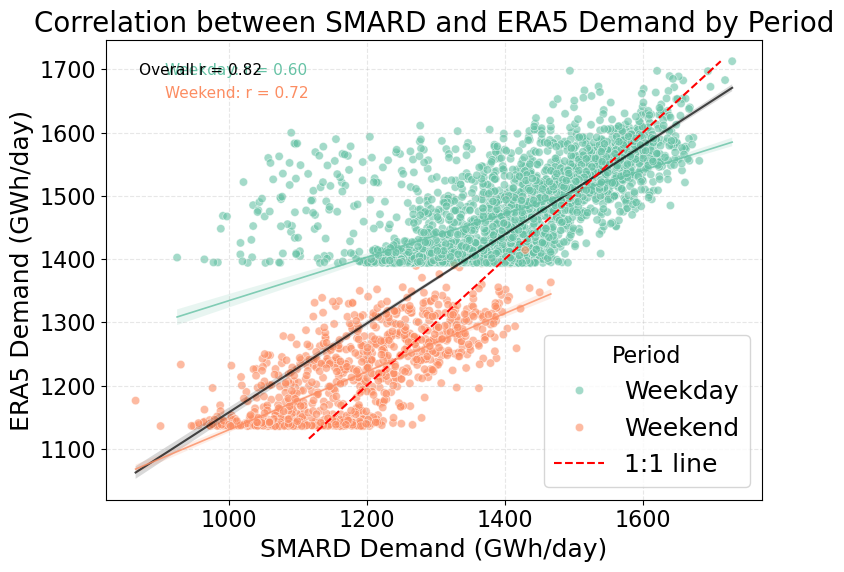

In [38]:
# define your palette so reg lines match the scatter hues
palette = dict(zip(df['period'].unique(), sns.color_palette('Set2', n_colors=df['period'].nunique())))

plt.figure(figsize=(8, 6))

# scatter by period
sns.scatterplot(
    x='demand_SMARD', y='demand_ERA5_wwd',
    hue='period', data=df,
    alpha=0.6, palette=palette
)

# overall regression
sns.regplot(
    x='demand_SMARD', y='demand_ERA5_wwd',
    data=df, scatter=False,
    color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7}
)

# 1:1 line
x_line = np.linspace(df['demand_ERA5_wwd'].min() - 20, df['demand_ERA5_wwd'].max(), 100)
plt.plot(x_line, x_line, color='red', linestyle='--', label='1:1 line')

# per-period regression lines & annotations
ymin, ymax = plt.ylim()
xpos = df['demand_SMARD'].min() + 0.05 * (df['demand_SMARD'].max() - df['demand_SMARD'].min())
ypos_start = ymax - 0.05 * (ymax - ymin)

for i, period in enumerate(df['period'].unique()):
    sub = df[df['period'] == period]
    # regression line for this period
    sns.regplot(
        x='demand_SMARD', y='demand_ERA5_wwd',
        data=sub, scatter=False,
        color=palette[period],
        line_kws={'linewidth': 1.2, 'alpha': 0.8}
    )
    # compute Pearson r
    r, p = pearsonr(sub['demand_SMARD'], sub['demand_ERA5_wwd'])
    # annotate on plot, stacking vertically
    plt.text(
        xpos,
        ypos_start - i*0.05*(ymax - ymin),
        f'{period}: r = {r:.2f}',
        color=palette[period],
        fontsize=11,
        verticalalignment='top'
    )

# overall Pearson annotation
r_overall, _ = pearsonr(df['demand_SMARD'], df['demand_ERA5_wwd'])
plt.text(
    0.05, 0.95, f'Overall r = {r_overall:.2f}',
    transform=plt.gca().transAxes,
    fontsize=11, verticalalignment='top'
)

plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
plt.title('Correlation between SMARD and ERA5 Demand by Period')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title='Period', loc='best')
plt.tight_layout()
plt.show()


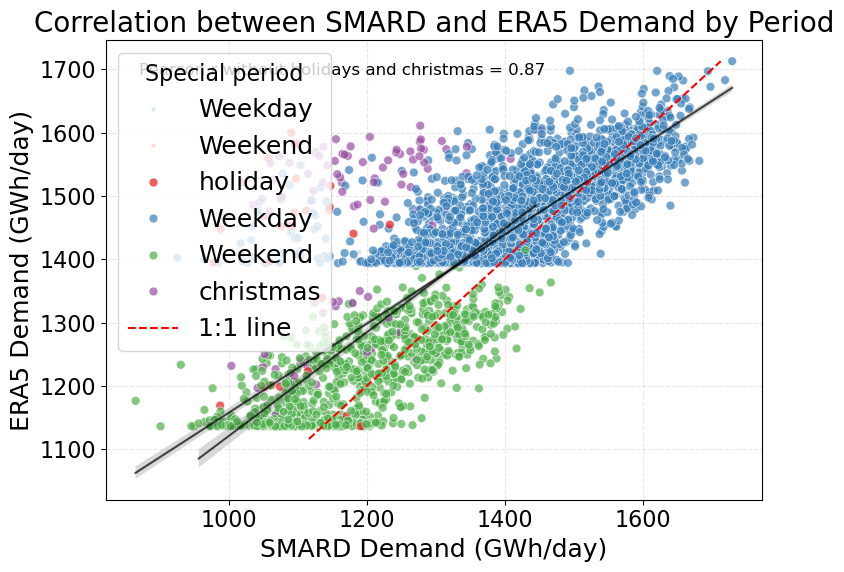

In [39]:
plt.figure(figsize=(8, 6))

# Background points: weekday & weekend
background_mask = df['special'].isin(['weekday', 'weekend', 'summer'])
sns.scatterplot(x='demand_SMARD', y='demand_ERA5_wwd', hue='period', data=df[background_mask], palette='Set2', alpha=0.3, s=10)

# Foreground points: special periods
foreground_mask = ~background_mask
sns.scatterplot(x='demand_SMARD', y='demand_ERA5_wwd', hue='special', data=df[foreground_mask], alpha=0.7, palette='Set1', s=40)
df_norm = df[background_mask]
# Optional regression line
sns.regplot(x='demand_SMARD', y='demand_ERA5_wwd', data=df_norm, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})
sns.regplot(x='demand_SMARD', y='demand_ERA5_wwd', data=df, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})

# Pearson correlation
r, _ = pearsonr(df['demand_SMARD'], df['demand_ERA5_wwd'])
r, _ = pearsonr(df['demand_SMARD'][background_mask], df['demand_ERA5_wwd'][background_mask])

plt.text(0.05, 0.95, f'Pearson r without holidays and christmas = {r:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# 1:1 line
x = np.linspace(df['demand_ERA5_wwd'].min() - 20, df['demand_ERA5_wwd'].max(), 100)
plt.plot(x, x, color='red', linestyle='--', label='1:1 line')

# Labels and styling
plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
plt.title('Correlation between SMARD and ERA5 Demand by Period')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(title='Special period', loc='best')
plt.tight_layout()
plt.show()


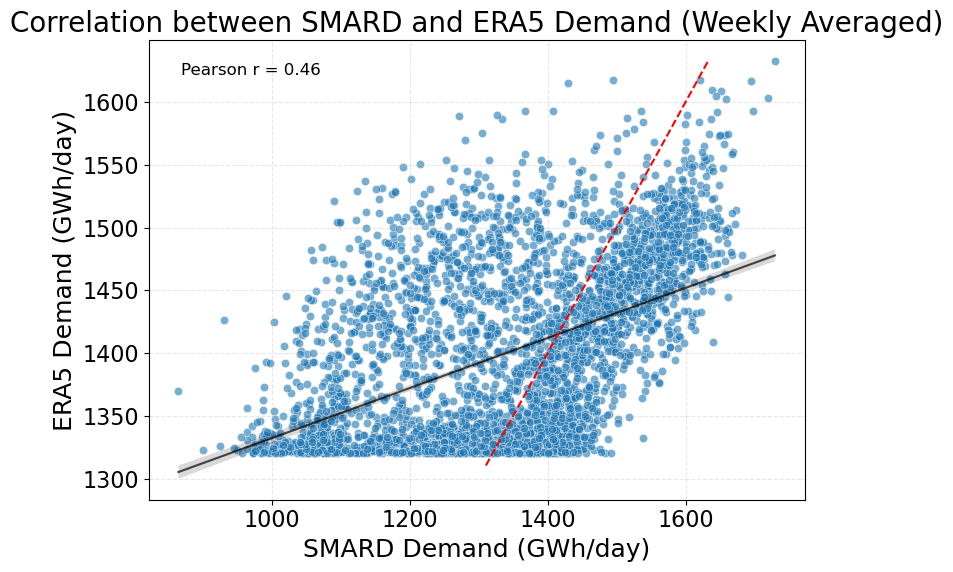

In [40]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='demand_SMARD', y='demand_ERA5',  data=df, alpha=0.6)

# Optional regression line (overall trend)
sns.regplot(x='demand_SMARD', y='demand_ERA5', data=df, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7})

# Pearson correlation
r, _ = pearsonr(df['demand_SMARD'], df['demand_ERA5'])
plt.text(0.05, 0.95, f'Pearson r = {r:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Plot 1:1 line
x = np.linspace(df['demand_ERA5'].min()-10, df['demand_ERA5'].max(), 100)
y = x
plt.plot(x, y, color='red', linestyle='--', label='1:1 line')

plt.xlabel('SMARD Demand (GWh/day)')
plt.ylabel('ERA5 Demand (GWh/day)')
# plt.xlim(900, 1800)
# plt.ylim(900, 1800)
plt.title('Correlation between SMARD and ERA5 Demand (Weekly Averaged)')
plt.grid(True, linestyle='--', alpha=0.3)
# plt.legend(title='Period', loc='best')
plt.tight_layout()
plt.show()


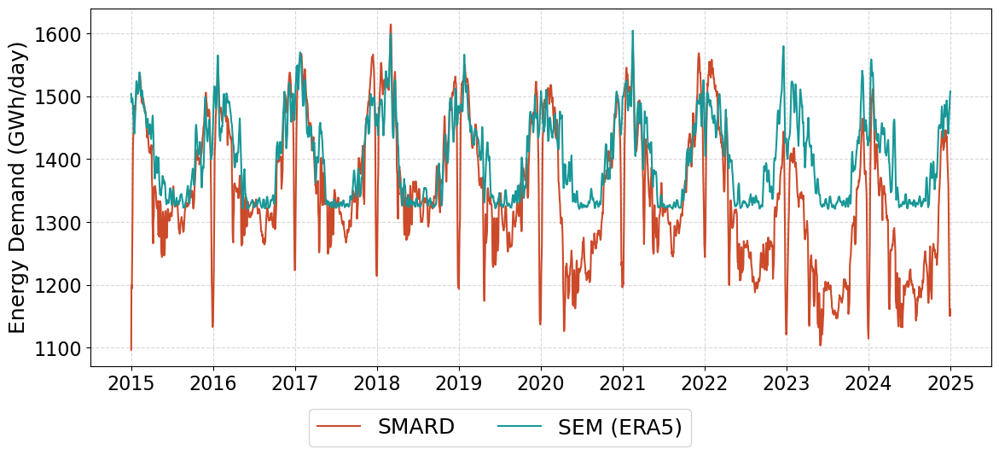

In [41]:
# --- Make all text bigger (global defaults) ---
mpl.rcParams.update({
    'font.size': 14+2,          # base font size
    'axes.titlesize': 18+2,     # title
    'axes.labelsize': 16+2,     # axis labels
    'xtick.labelsize': 14+2,    # x tick labels
    'ytick.labelsize': 14+2,    # y tick labels
    'legend.fontsize': 16+2,    # legend text (fallback)
    'figure.titlesize': 20+2,   # figure title (if used elsewhere)
})

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(df_demand['date'], df_demand['dem_SMARD_RM'], label='SMARD', color="#CC4A2A")
ax.plot(df_demand['date'], df_demand['dem_ERA5_RM'], label='SEM (ERA5)', color="#189797")

# title and ylabel (explicit sizes to be safe)
# ax.set_title('SMARD vs SEM (ERA5) Demand', fontsize=18)
ax.set_ylabel('Energy Demand (GWh/day)')

ax.grid(True, linestyle='--', alpha=0.5)

# collect handles & labels and create a centered legend below the axes
handles, labels = ax.get_legend_handles_labels()
if handles:
    # make room at bottom for the legend
    fig.subplots_adjust(bottom=0.18)
    fig.legend(handles, labels, loc='lower center',
               ncol=len(labels), bbox_to_anchor=(0.5, -0.1),
               frameon=True)

plt.tight_layout()
# save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_time_series_RM.png', dpi=300, bbox_inches='tight')
plt.show()


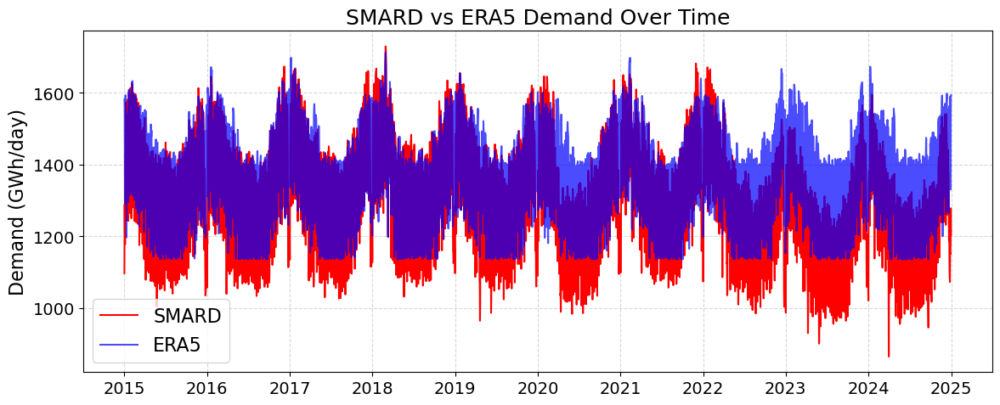

In [42]:
mpl.rcParams.update({
    'font.size': 14,          # base font size
    'axes.titlesize': 18,     # title
    'axes.labelsize': 16,     # axis labels
    'xtick.labelsize': 14,    # x tick labels
    'ytick.labelsize': 14,    # y tick labels
    'legend.fontsize': 16,    # legend text (fallback)
    'figure.titlesize': 20,   # figure title (if used elsewhere)
})

plt.figure(figsize=(12, 5))
plt.plot(df['date'], df['demand_SMARD'], label='SMARD', color='red')
plt.plot(df['date'], df['demand_ERA5_wwd'], label='ERA5', color='blue', alpha=0.7)
plt.title('SMARD vs ERA5 Demand Over Time')
plt.ylabel('Demand (GWh/day)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
# save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_time_series_draft.png', dpi=300, bbox_inches='tight')
plt.show()

In [43]:
# Setup colormaps
years    = list(range(2015, 2025))
n_years  = len(years)
for i, year in enumerate(years):
    frac = i / (n_years) +0.1
    print(frac)

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7
0.7999999999999999
0.9
1.0


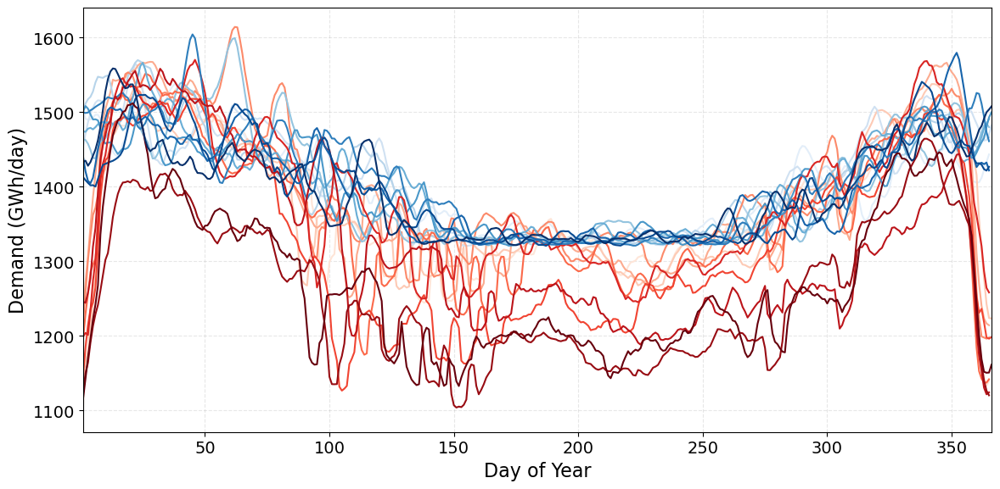

In [44]:
# 1) Prepare and smooth
df_dem = df.copy()
df_dem['date'] = pd.to_datetime(df_dem['date'])
df_dem.set_index('date', inplace=True)

# 7‑day rolling mean
df_dem_roll = df_dem[['demand_SMARD','demand_ERA5']].rolling('7D').mean()

# 2) Add day-of-year
df_dem_roll['doy'] = df_dem_roll.index.dayofyear

# 3) Setup colormaps
years    = list(range(2015, 2025))
n_years  = len(years)
# smard_cmap = mpl.cm.get_cmap('Reds',   n_years)
# era5_cmap  = mpl.cm.get_cmap('Blues',  n_years)
reds  = mpl.colormaps['Reds']
blues = mpl.colormaps['Blues']


plt.figure(figsize=(12, 6))

# 4) Plot each year as one cycle
for i, year in enumerate(years):
    frac = i / (n_years) +0.1
    yearly = df_dem_roll[df_dem_roll.index.year == year]
    
    # SMARD
    plt.plot(
        yearly['doy'], yearly['demand_SMARD'],
        color=reds(frac), linewidth=1.5,
        # color=smard_cmap(i), linewidth=1.5,
        label=f"{year} SMARD" if year == years[0] else None
    )
    # ERA5
    plt.plot(
        yearly['doy'], yearly['demand_ERA5'],
        color=blues(frac), linewidth=1.5,
        # color=era5_cmap(i), linewidth=1.5,
        label=f"{year} ERA5" if year == years[0] else None
    )

# 5) Legend hack: one entry per dataset
# plt.plot([], [], color='black', label='SMARD', linewidth=2)
# plt.plot([], [], color='gray',  label='ERA5',  linewidth=2)
# plt.legend(loc='upper right')

# plt.title("7‑Day Rolling Mean Demand by Day‑of‑Year (2015–2024)")
plt.xlabel("Day of Year")
plt.ylabel("Demand (GWh/day)")
plt.xlim(1, 366)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_rolling_mean_draft.png', dpi=300, bbox_inches='tight')
plt.show()


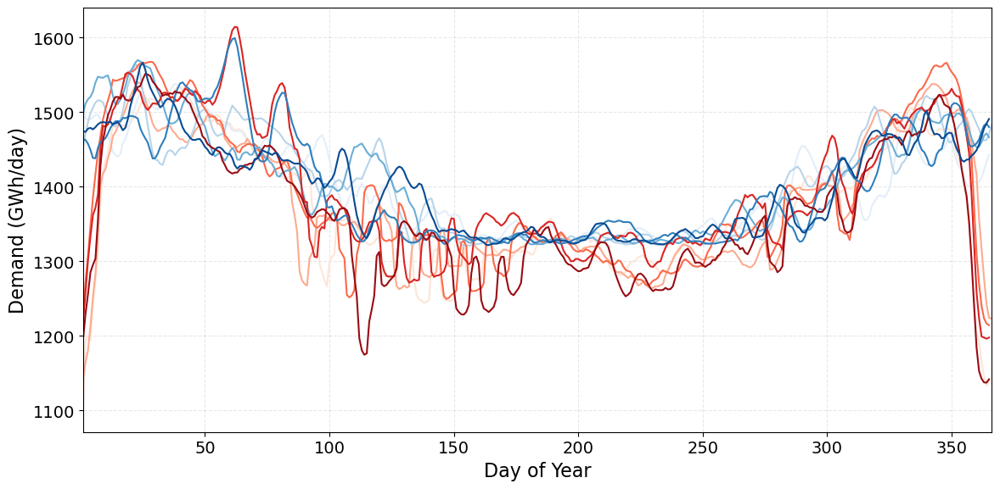

In [45]:


# 1) Prepare and smooth
df_dem = df.copy()
df_dem['date'] = pd.to_datetime(df_dem['date'])
df_dem.set_index('date', inplace=True)

# 7‑day rolling mean
df_dem_roll = df_dem[['demand_SMARD','demand_ERA5']].rolling('7D').mean()

# 2) Add day-of-year
df_dem_roll['doy'] = df_dem_roll.index.dayofyear

# 3) Setup colormaps
years    = list(range(2015, 2020))
n_years  = len(years)
# smard_cmap = mpl.cm.get_cmap('Reds',   n_years)
# era5_cmap  = mpl.cm.get_cmap('Blues',  n_years)
reds  = mpl.colormaps['Reds']
blues = mpl.colormaps['Blues']


plt.figure(figsize=(12, 6))

# 4) Plot each year as one cycle
for i, year in enumerate(years):
    frac = i / (n_years) + 0.1
    yearly = df_dem_roll[df_dem_roll.index.year == year]
    
    # SMARD
    plt.plot(
        yearly['doy'], yearly['demand_SMARD'],
        color=reds(frac), linewidth=1.5,
        # color=smard_cmap(i), linewidth=1.5,
        label=f"{year} SMARD" if year == years[0] else None
    )
    # ERA5
    plt.plot(
        yearly['doy'], yearly['demand_ERA5'],
        color=blues(frac), linewidth=1.5,
        # color=era5_cmap(i), linewidth=1.5,
        label=f"{year} ERA5" if year == years[0] else None
    )

# 5) Legend hack: one entry per dataset
# plt.plot([], [], color='black', label='SMARD', linewidth=2)
# plt.plot([], [], color='gray',  label='ERA5',  linewidth=2)
# plt.legend(loc='upper right')

# plt.title("7‑Day Rolling Mean Demand by Day‑of‑Year (2015–2024)")
plt.xlabel("Day of Year")
plt.ylabel("Demand (GWh/day)")
plt.xlim(1, 366)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_rolling_mean_draft.png', dpi=300, bbox_inches='tight')
plt.show()


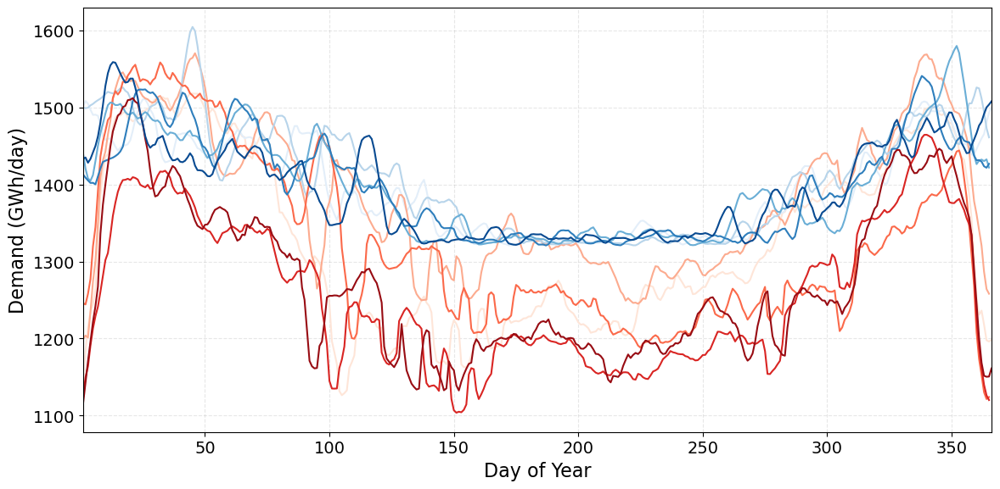

In [46]:


# 1) Prepare and smooth
df_dem = df.copy()
df_dem['date'] = pd.to_datetime(df_dem['date'])
df_dem.set_index('date', inplace=True)

# 7‑day rolling mean
df_dem_roll = df_dem[['demand_SMARD','demand_ERA5']].rolling('7D').mean()

# 2) Add day-of-year
df_dem_roll['doy'] = df_dem_roll.index.dayofyear

# 3) Setup colormaps
years    = list(range(2020, 2025))
n_years  = len(years)
# smard_cmap = mpl.cm.get_cmap('Reds',   n_years)
# era5_cmap  = mpl.cm.get_cmap('Blues',  n_years)
reds  = mpl.colormaps['Reds']
blues = mpl.colormaps['Blues']


plt.figure(figsize=(12, 6))

# 4) Plot each year as one cycle
for i, year in enumerate(years):
    frac = i / (n_years) + 0.1
    yearly = df_dem_roll[df_dem_roll.index.year == year]
    
    # SMARD
    plt.plot(
        yearly['doy'], yearly['demand_SMARD'],
        color=reds(frac), linewidth=1.5,
        # color=smard_cmap(i), linewidth=1.5,
        label=f"{year} SMARD" if year == years[0] else None
    )
    # ERA5
    plt.plot(
        yearly['doy'], yearly['demand_ERA5'],
        color=blues(frac), linewidth=1.5,
        # color=era5_cmap(i), linewidth=1.5,
        label=f"{year} ERA5" if year == years[0] else None
    )

# 5) Legend hack: one entry per dataset
# plt.plot([], [], color='black', label='SMARD', linewidth=2)
# plt.plot([], [], color='gray',  label='ERA5',  linewidth=2)
# plt.legend(loc='upper right')

# plt.title("7‑Day Rolling Mean Demand by Day‑of‑Year (2015–2024)")
plt.xlabel("Day of Year")
plt.ylabel("Demand (GWh/day)")
plt.xlim(1, 366)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_rolling_mean_draft.png', dpi=300, bbox_inches='tight')
plt.show()


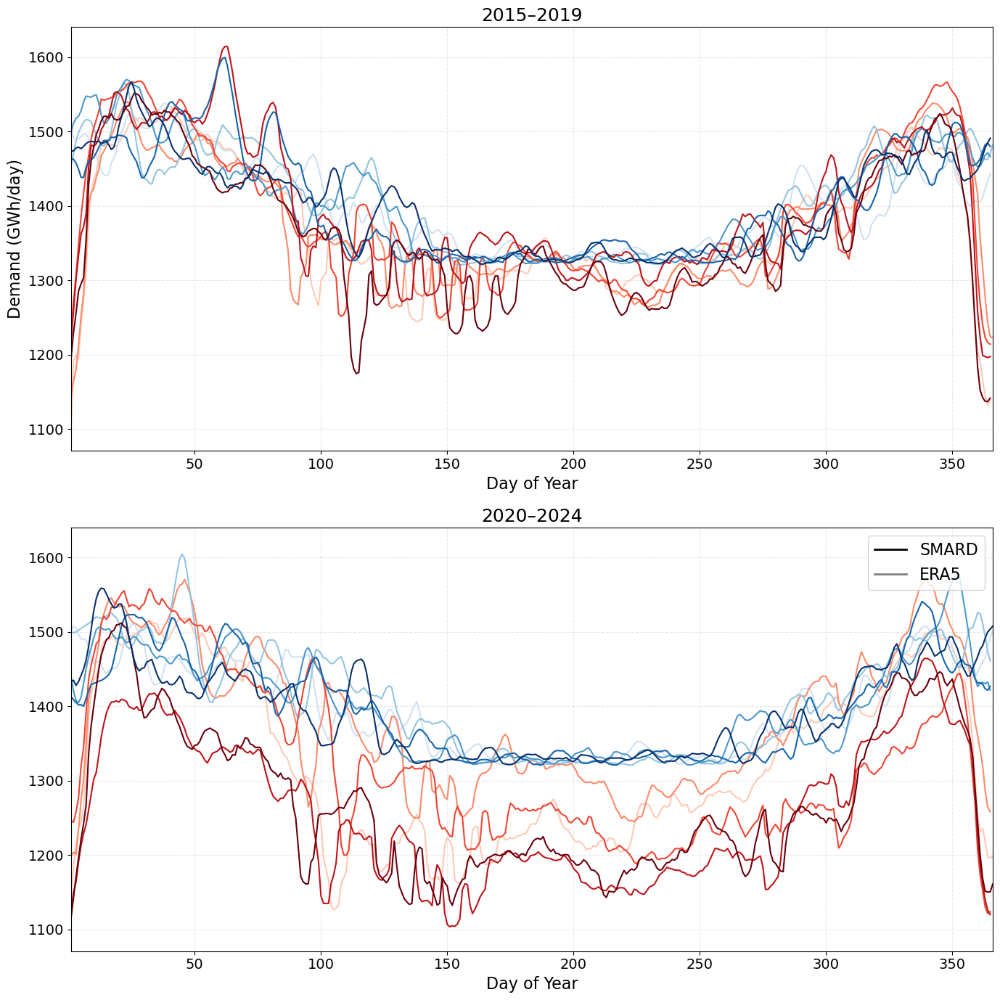

In [47]:
# --- Prepare & smooth once ---
df_dem = df.copy()
df_dem['date'] = pd.to_datetime(df_dem['date'])
df_dem.set_index('date', inplace=True)
df_roll = df_dem[['demand_SMARD','demand_ERA5']].rolling('7D').mean()
df_roll['doy'] = df_roll.index.dayofyear

# --- Set up subplots ---
fig, axes = plt.subplots(2, 1, figsize=(14, 14), sharey=True)

# Define your two year‑ranges
ranges = [(2015, 2020), (2020, 2025)]
titles = ['2015–2019', '2020–2024']

# Continuous colormaps
reds  = mpl.colormaps['Reds']
blues = mpl.colormaps['Blues']

for ax, (start, stop), title in zip(axes, ranges, titles):
    years = list(range(start, stop))
    n_years = len(years)
    
    for i, year in enumerate(years):
        frac = 0.2 + 0.8 * (i / (n_years - 1))  # darker for later years
        yearly = df_roll[df_roll.index.year == year]
        
        # SMARD in reds
        ax.plot(
            yearly['doy'], yearly['demand_SMARD'],
            color=reds(frac), linewidth=1.5,
            label=f"{year} SMARD" if (year == years[0] and start==2015) else None
        )
        # ERA5 in blues
        ax.plot(
            yearly['doy'], yearly['demand_ERA5'],
            color=blues(frac), linewidth=1.5,
            label=f"{year} ERA5" if (year == years[0] and start==2015) else None
        )
    
    ax.set_title(title)
    ax.set_xlabel("Day of Year")
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.set_xlim(1, 366)

# Y‑axis label on the left subplot
axes[0].set_ylabel("Demand (GWh/day)")

# Global legend hack: show only SMARD & ERA5 once
axes[-1].plot([], [], color='black', label='SMARD', linewidth=2)
axes[-1].plot([], [], color='gray',  label='ERA5',  linewidth=2)
axes[-1].legend(loc='upper right')

plt.tight_layout()
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_rolling_mean_combined_draft.png', dpi=300, bbox_inches='tight')
plt.show()


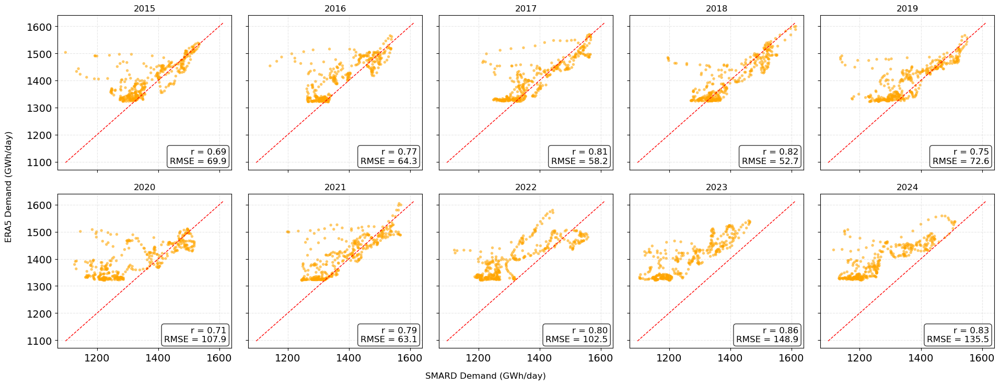

In [48]:

# 1) Prepare your DataFrame
df_demand['date'] = pd.to_datetime(df_demand['date'])
df_demand.set_index('date', inplace=True)
df_demand['year'] = df_demand.index.year

# 2) Set up 2×5 subplots for 2015–2024
years = list(range(2015, 2025))
fig, axes = plt.subplots(2, 5, figsize=(20, 8), sharex=True, sharey=True)
axes = axes.flatten()

min_val = min(df_demand['dem_ERA5_RM'].min(), df_demand['dem_SMARD_RM'].min())
max_val = max(df_demand['dem_ERA5_RM'].max(), df_demand['dem_SMARD_RM'].max())

for ax, year in zip(axes, years):
    # Filter for this year
    data_year = df_demand[df_demand['year'] == year]
    x = data_year['dem_SMARD_RM'].dropna()
    y = data_year['dem_ERA5_RM'].dropna()

    # Scatter
    ax.scatter(x, y, alpha=0.6, s=15, color='orange', edgecolor='none')
    
    # 1:1 line
    # lo = min(ax.get_xlim()[0], ax.get_ylim()[0])
    # hi = max(ax.get_xlim()[1], ax.get_ylim()[1])
    # ax.plot([lo, hi], [lo, hi], 'r--', lw=1)
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    
    # Compute & annotate Pearson r and RMSE
    if len(x) > 1:
        r, _ = pearsonr(x, y)
        rmse = np.sqrt(np.mean((x - y)**2))
        ax.text(
            0.97, 0.03,
            f"r = {r:.2f}\nRMSE = {rmse:.1f}",
            transform=ax.transAxes,
            ha='right', va='bottom',
            fontsize=12,
            bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.3')
        )

    ax.set_title(str(year), fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.3)

# Global axis labels
fig.text(0.5, 0.04, 'SMARD Demand (GWh/day)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'ERA5 Demand (GWh/day)', va='center', rotation='vertical', fontsize=12)

# plt.suptitle('Per-Year SMARD vs ERA5 Demand (2015–2024)', fontsize=16, y=0.98)
plt.tight_layout(rect=[0.05, 0.05, 1, 0.96])
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_per_year_scatter_draft.png', dpi=300, bbox_inches='tight')
plt.show()


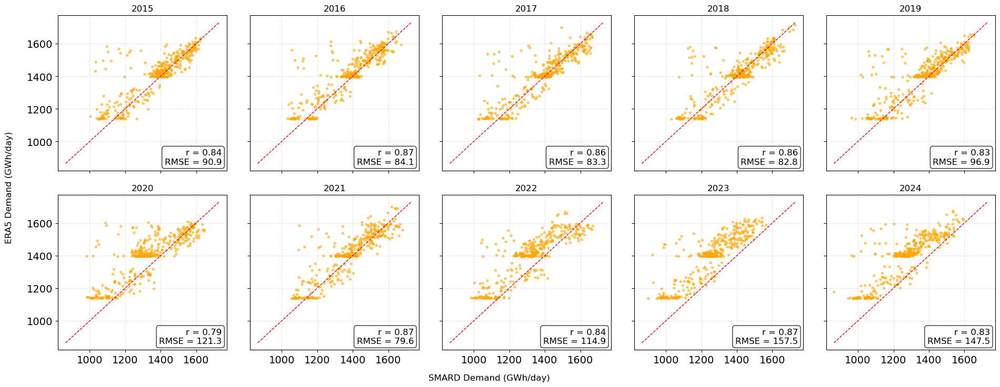

In [52]:

df_demand = df.copy()
# 1) Prepare your DataFrame
df_demand['date'] = pd.to_datetime(df_demand['date'])
df_demand.set_index('date', inplace=True)
df_demand['year'] = df_demand.index.year

# 2) Set up 2×5 subplots for 2015–2024
years = list(range(2015, 2025))
fig, axes = plt.subplots(2, 5, figsize=(20, 8), sharex=True, sharey=True)
axes = axes.flatten()

min_val = min(df_demand['demand_ERA5_wwd'].min(), df_demand['demand_SMARD'].min())
max_val = max(df_demand['demand_ERA5_wwd'].max(), df_demand['demand_SMARD'].max())

for ax, year in zip(axes, years):
    # Filter for this year
    data_year = df_demand[df_demand['year'] == year]
    x = data_year['demand_SMARD'].dropna()
    y = data_year['demand_ERA5_wwd'].dropna()
    
    # Scatter
    ax.scatter(x, y, alpha=0.6, s=15, color='orange', edgecolor='none')
    
    # 1:1 line
    # lo = min(ax.get_xlim()[0], ax.get_ylim()[0])
    # hi = max(ax.get_xlim()[1], ax.get_ylim()[1])
    # ax.plot([lo, hi], [lo, hi], 'r--', lw=1)
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    
    # Compute & annotate Pearson r and RMSE
    if len(x) > 1:
        r, _ = pearsonr(x, y)
        rmse = np.sqrt(np.mean((x - y)**2))
        ax.text(
            0.97, 0.03,
            f"r = {r:.2f}\nRMSE = {rmse:.1f}",
            transform=ax.transAxes,
            ha='right', va='bottom',
            fontsize=12,
            bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.3')
        )

    ax.set_title(str(year), fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.3)

# Global axis labels
fig.text(0.5, 0.04, 'SMARD Demand (GWh/day)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'ERA5 Demand (GWh/day)', va='center', rotation='vertical', fontsize=12)

# plt.suptitle('Per-Year SMARD vs ERA5 Demand (2015–2024)', fontsize=16, y=0.98)
plt.tight_layout(rect=[0.05, 0.05, 1, 0.96])
# Save the figure
# plt.savefig('/home/onennecke/Code/Figures/demand_per_year_scatter_draft.png', dpi=300, bbox_inches='tight')
plt.show()


### Model visualisation plot

In [46]:

demand_fit_values = xr.open_dataset('/climca/people/onennecke/population_data/demand_fit_values_week.nc')
# Create array from -15:45
temperature_plt = np.arange(-20, 60.5, 0.5)
v_weekday = demand_fit_values.sel(country = 9, period = 'weekday')
v_weekend = demand_fit_values.sel(country = 9, period = 'weekend')
v_week = demand_fit_values.sel(country = 9, period = 'week')

demand_weekday = np.zeros(len(temperature_plt))
demand_weekend = np.zeros(len(temperature_plt))
demand_week = np.zeros(len(temperature_plt))

for i in range(len(temperature_plt)):
    demand_weekday[i] = demand.LSTRmodel(temperature_plt[i], v_weekday)
    if (demand_weekday[i] > v_weekday.heating_max) & (temperature_plt[i] < v_weekday.f):
        demand_weekday[i] = v_weekday.heating_max
    if (demand_weekday[i] > v_weekday.cooling_max) & (temperature_plt[i] > v_weekday.f):
        demand_weekday[i] = v_weekday.cooling_max

    demand_weekend[i] = demand.LSTRmodel(temperature_plt[i], v_weekend)
    if (demand_weekend[i] > v_weekend.heating_max) & (temperature_plt[i] < v_weekend.f):
        demand_weekend[i] = v_weekend.heating_max
    if (demand_weekend[i] > v_weekend.cooling_max) & (temperature_plt[i] > v_weekend.f):
        demand_weekend[i] = v_weekend.cooling_max
    
    demand_week[i] = demand.LSTRmodel(temperature_plt[i], v_week)
    if (demand_week[i] > v_week.heating_max) & (temperature_plt[i] < v_week.f):
        demand_week[i] = v_week.heating_max
    if (demand_week[i] > v_week.cooling_max) & (temperature_plt[i] > v_week.f):
        demand_week[i] = v_week.cooling_max

In [47]:
print(v_week.heating_max.values.round(2), v_week.cooling_max.values.round(2))
v_week.cooling_max.values

1702.51 1472.8


array(1472.80486656)

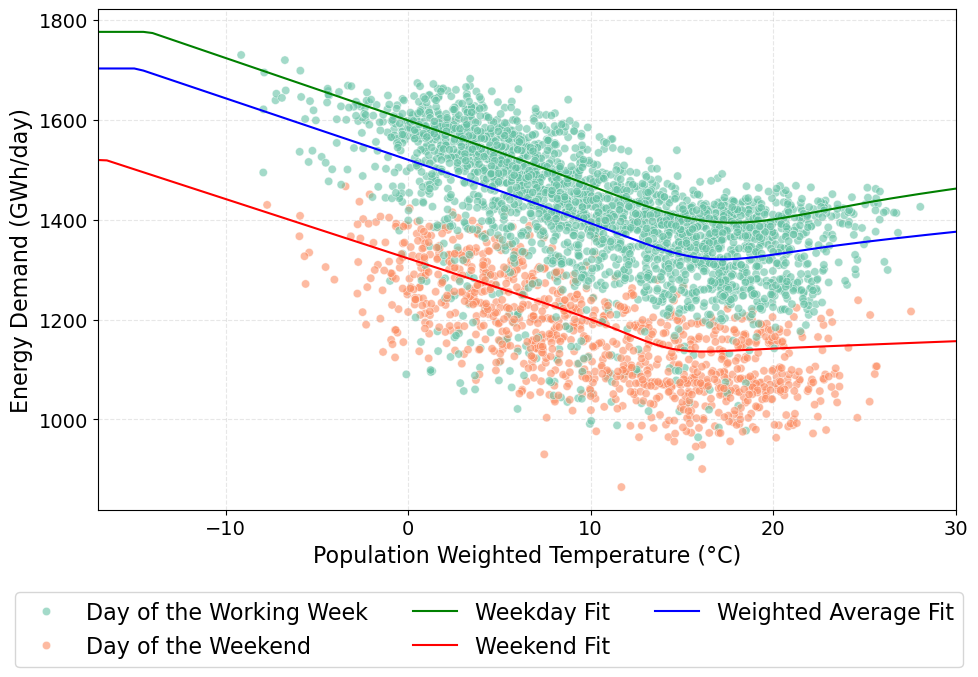

In [ ]:
# --- Make all text bigger (global defaults) ---
mpl.rcParams.update({
    'font.size': 14,          # base font size
    'axes.titlesize': 18,     # title
    'axes.labelsize': 16,     # axis labels
    'xtick.labelsize': 14,    # x tick labels
    'ytick.labelsize': 14,    # y tick labels
    'legend.fontsize': 16,    # legend text (fallback)
    'figure.titlesize': 20,   # figure title (if used)
})

fig, ax = plt.subplots(figsize=(10, 6))

# Scatterplot (uses the axes object now)
scatter = sns.scatterplot(x='temp_ERA5', y='demand_SMARD', hue='period', data=df, alpha=0.6, palette='Set2', ax=ax)

# Line plots (capture the Line2D objects)
line1 = ax.plot(temperature_plt, demand_weekday, linestyle='-', color='g', label='Weekday Fit')
line2 = ax.plot(temperature_plt, demand_weekend, linestyle='-', color='r', label='Weekend Fit')
line3 = ax.plot(temperature_plt, demand_week, linestyle='-', color='b', label='Weighted Average Fit')

# Remove the automatic in-axes legend created by seaborn
if getattr(ax, "legend_", None):
    ax.legend_.remove()

# Get handles and labels from scatter (hue categories)
scatter_handles, scatter_labels = scatter.get_legend_handles_labels()
# rename the first two scatter labels just like in your original snippet
if len(scatter_labels) >= 2:
    scatter_labels[0], scatter_labels[1] = 'Day of the Working Week', 'Day of the Weekend'

# line handles (each plot returns a list; take the first element)
line_handles = [line1[0], line2[0], line3[0]]
line_labels  = ['Weekday Fit', 'Weekend Fit', 'Weighted Average Fit']

# Combine handles/labels: scatter first, then lines
handles = scatter_handles + line_handles
labels  = scatter_labels + line_labels

# Deduplicate so each label appears only once (preserve order)
unique_handles = []
unique_labels = []
seen = set()
for h, l in zip(handles, labels):
    if l and l not in seen:
        seen.add(l)
        unique_handles.append(h)
        unique_labels.append(l)

# Make room at bottom and put a centered legend underneath
if unique_handles:
    fig.subplots_adjust(bottom=0.18)  # create space for the legend
    fig.legend(unique_handles, unique_labels, loc='lower center',
               ncol=3, bbox_to_anchor=(0.5, -0.15),
               fontsize=16, frameon=True)

# Axes labels (explicit sizes to be safe)
ax.set_ylabel('Energy Demand (GWh/day)', fontsize=16)
ax.set_xlabel('Population Weighted Temperature (°C)', fontsize=16)

ax.set_xlim([-10, 30])
ax.set_xlim([-17, 30])

ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()

# save the plot
# plt.savefig('/home/onennecke/Code/Figures/demand_fit_germany.png', dpi=300, bbox_inches='tight')

plt.show()


### RL Comparison

In [71]:
df['RL_corrected_wwd'] = df['demand_ERA5_wwd'] - df['tot_prod_s_corrected']

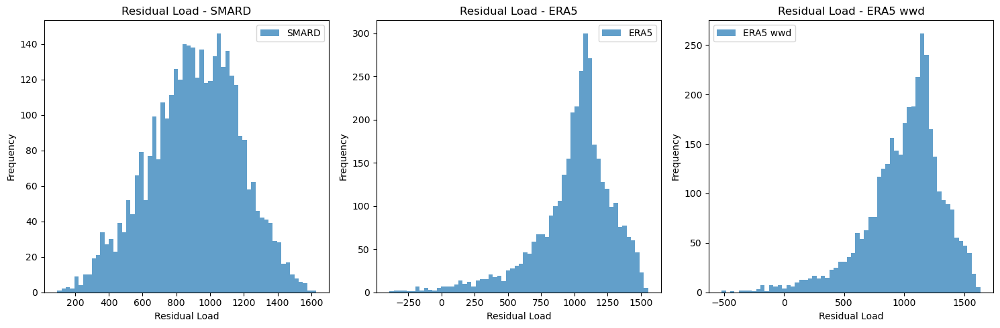

SMARD: 
 Min: 93.3345 Max: 1627.71375 
 Mean: 908.2241019178082 Std: 264.8575582206961
ERA5: 
 Min: -391.20872391260605 Max: 1554.145255744495 
 Mean: 1000.8879957664926 Std: 291.5170440539308
ERA5 wwd: 
 Min: -518.7666576599395 Max: 1633.7801901078033 
 Mean: 999.8697644462954 Std: 316.7236797165348


In [72]:
# Make three histograms to compare the RL data

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(df['residual_load_SMARD'], bins=60, alpha=0.7, label='SMARD')
plt.title('Residual Load - SMARD')
plt.xlabel('Residual Load')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 3, 2)
plt.hist(df['RL_corrected'], bins=60, alpha=0.7, label='ERA5')
plt.title('Residual Load - ERA5')
plt.xlabel('Residual Load')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 3, 3)
plt.hist(df['RL_corrected_wwd'], bins=60, alpha=0.7, label='ERA5 wwd')
plt.title('Residual Load - ERA5 wwd')
plt.xlabel('Residual Load')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


print('SMARD: \n Min:', df['residual_load_SMARD'].min(), 'Max:', df['residual_load_SMARD'].max(), '\n Mean:', df['residual_load_SMARD'].mean(), 'Std:', df['residual_load_SMARD'].std())
print('ERA5: \n Min:', df['RL_corrected'].min(), 'Max:', df['RL_corrected'].max(), '\n Mean:', df['RL_corrected'].mean(), 'Std:', df['RL_corrected'].std())
print('ERA5 wwd: \n Min:', df['RL_corrected_wwd'].min(), 'Max:', df['RL_corrected_wwd'].max(), '\n Mean:', df['RL_corrected_wwd'].mean(), 'Std:', df['RL_corrected_wwd'].std())

### Compare variables to output

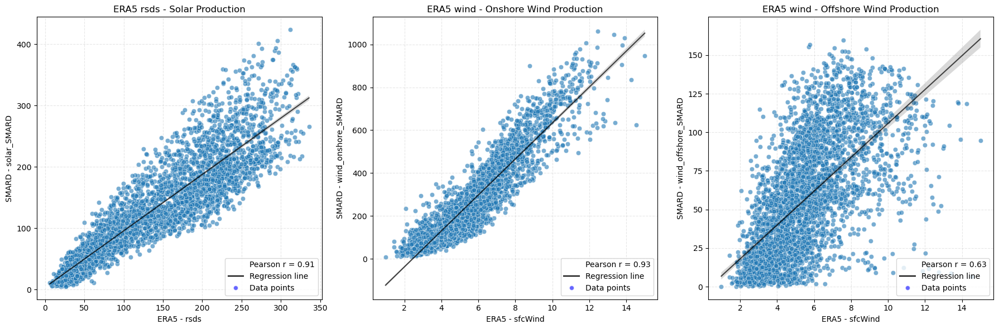

In [81]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
plot_specs = [
    ('rsds', 'solar_SMARD', 'ERA5 rsds - Solar Production'),
    ('sfcWind', 'wind_onshore_SMARD', 'ERA5 wind - Onshore Wind Production'),
    ('sfcWind', 'wind_offshore_SMARD', 'ERA5 wind - Offshore Wind Production')
]

for ax, (col_era5, col_smard, title) in zip(axs.flat, plot_specs):
    sns.scatterplot(x=col_era5, y=col_smard, data=df, alpha=0.6, ax=ax)
    
    # Regression line
    sns.regplot(x=col_era5, y=col_smard, data=df, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7}, ax=ax)
    
    # Pearson r
    r, _ = pearsonr(df[col_smard], df[col_era5])
    
    mae = np.mean(np.abs(df[col_smard] - df[col_era5]))
    rmse = np.sqrt(np.mean((df[col_smard] - df[col_era5])**2))
    mbe = np.mean(df[col_era5] - df[col_smard])


        # Custom legend entries
    legend_elements = [
        Line2D([0], [0], color='w', label=f'Pearson r = {r:.2f}'),  # invisible line, just for text
        Line2D([0], [0], linestyle='-', color='black', label='Regression line'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', label='Data points', alpha=0.6)
    ]
    ax.legend(handles=legend_elements, loc='lower right', frameon=True)
    ax.set_ylabel(f'SMARD - {col_smard}')
    ax.set_xlabel(f'ERA5 - {col_era5}')
    ax.set_title(f'{title}')
    ax.grid(True, linestyle='--', alpha=0.3)
    # ax.legend(loc='best')

plt.tight_layout()
plt.show()


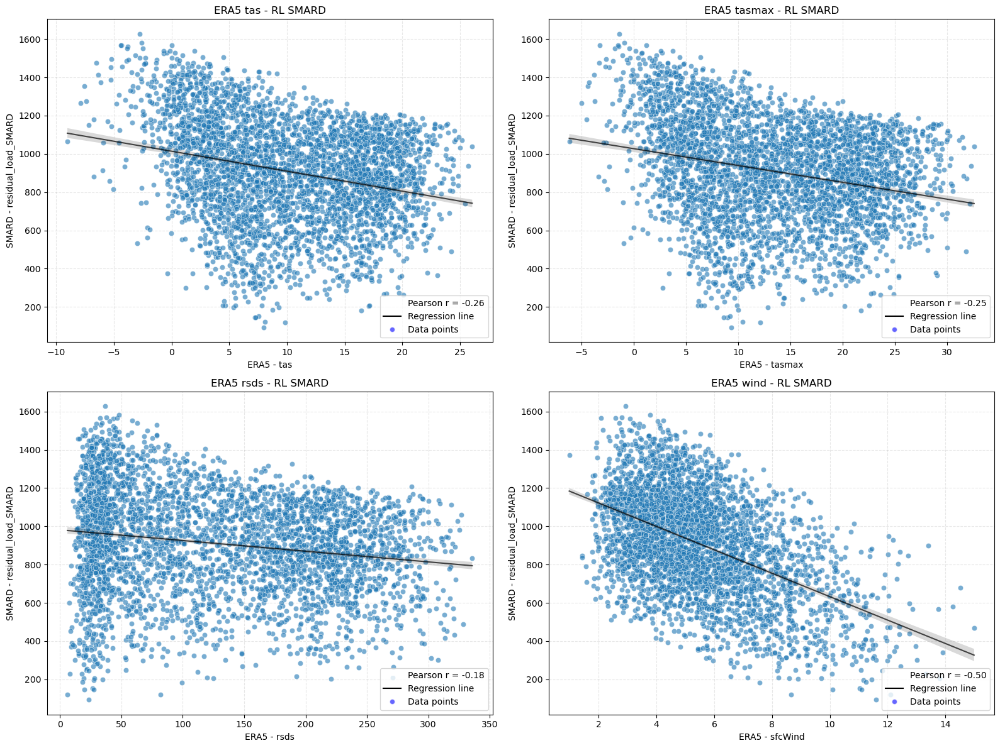

In [82]:
fig, axs = plt.subplots(2, 2, figsize=(16, 12))
plot_specs = [
    ('tas', 'residual_load_SMARD', 'ERA5 tas - RL SMARD'),
    ('tasmax', 'residual_load_SMARD', 'ERA5 tasmax - RL SMARD'),
    ('rsds', 'residual_load_SMARD', 'ERA5 rsds - RL SMARD'),
    ('sfcWind', 'residual_load_SMARD', 'ERA5 wind - RL SMARD')

]

for ax, (col_era5, col_smard, title) in zip(axs.flat, plot_specs):
    sns.scatterplot(x=col_era5, y=col_smard, data=df, alpha=0.6, ax=ax)
    
    # Regression line
    sns.regplot(x=col_era5, y=col_smard, data=df, scatter=False, color='black', line_kws={'linewidth': 1.5, 'alpha': 0.7}, ax=ax)
    
    # Pearson r
    r, _ = pearsonr(df[col_smard], df[col_era5])
    
    mae = np.mean(np.abs(df[col_smard] - df[col_era5]))
    rmse = np.sqrt(np.mean((df[col_smard] - df[col_era5])**2))
    mbe = np.mean(df[col_era5] - df[col_smard])


        # Custom legend entries
    legend_elements = [
        Line2D([0], [0], color='w', label=f'Pearson r = {r:.2f}'),  # invisible line, just for text
        Line2D([0], [0], linestyle='-', color='black', label='Regression line'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', label='Data points', alpha=0.6)
    ]
    ax.legend(handles=legend_elements, loc='lower right', frameon=True)
    ax.set_ylabel(f'SMARD - {col_smard}')
    ax.set_xlabel(f'ERA5 - {col_era5}')
    ax.set_title(f'{title}')
    ax.grid(True, linestyle='--', alpha=0.3)
    # ax.legend(loc='best')

plt.tight_layout()
plt.show()
